In [14]:
import os 
from os import listdir
from os.path import join
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import imageutils
from math import sqrt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, mean_absolute_percentage_error

# Temporal Consistency 

In paper Section 3.2.3.2., overlay ratio 84% for DSTT, 88% for DIP

In [10]:
def var_consistency_frame(inpainted_image_before, inpainted_image_after, inpainted_image):
    
    inpainted_image_before_resize = inpainted_image_before[:202,:]/255
    inpainted_image_resize = inpainted_image[19:221,:]/255
    inpainted_image_after_resize = inpainted_image_after[36:238,:]/255
    
    #print(np.max(inpainted_image_resize), np.min(inpainted_image_resize))
    #print(np.max(inpainted_image_before_resize), np.min(inpainted_image_before_resize))
    print('Max-min frame values: {} - {}'.format(np.max(inpainted_image_resize), np.min(inpainted_image_resize)))
    
    def normalize_image(img):
        im_min = np.percentile(img.flatten(),0.5)
        im_max = np.percentile(img.flatten(),99.5)
        norm_img = np.zeros((img.shape[0],img.shape[1],img.shape[2]),dtype=np.float32)
        for i in range(img.shape[2]):
            norm_img[:,:,i] = imageutils.normalize(img[:,:,i], im_min, im_max)
        return norm_img
        
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(inpainted_image_before_resize)
    ax[1].imshow(inpainted_image_resize)
    ax[2].imshow(inpainted_image_after_resize)
    plt.show()
    
    #subtract pixel value by the average DN to make the calulation invariance to brightness
    inpainted_image_before_resize = inpainted_image_before_resize / np.mean(inpainted_image_before_resize)
    inpainted_image_resize = inpainted_image_resize / np.mean(inpainted_image_resize)
    inpainted_image_after_resize = inpainted_image_after_resize / np.mean(inpainted_image_after_resize)
    
    # Calculate var by stacking two rgb image
    compare_im1 = np.stack([inpainted_image_before_resize,inpainted_image_resize])
    compare_im2 = np.stack([inpainted_image_after_resize,inpainted_image_resize])
    print(compare_im1.shape)
        
    sigma_square1 = np.var(compare_im1,axis=0)
    sigma_square2 = np.var(compare_im2,axis=0)
    
    return sigma_square1, sigma_square2


def var_consistency_frame_DIP(inpainted_image_before, inpainted_image_after, inpainted_image):
    
    inpainted_image_before_resize = inpainted_image_before[:788,:]/255
    inpainted_image_resize = inpainted_image[54:842,:]/255
    inpainted_image_after_resize = inpainted_image_after[108:896,:]/255
    
    
    #print(np.max(inpainted_image_resize), np.min(inpainted_image_resize))
    #print(np.max(inpainted_image_before_resize), np.min(inpainted_image_before_resize))
    
    print('Max-min frame values: {} - {}'.format(np.max(inpainted_image_resize), np.min(inpainted_image_resize)))
    
    def normalize_image(img):
        im_min = np.percentile(img.flatten(),0.5)
        im_max = np.percentile(img.flatten(),99.5)
        norm_img = np.zeros((img.shape[0],img.shape[1],img.shape[2]),dtype=np.float32)
        for i in range(img.shape[2]):
            norm_img[:,:,i] = imageutils.normalize(img[:,:,i], im_min, im_max)
        return norm_img
        
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(inpainted_image_before_resize)
    ax[1].imshow(inpainted_image_resize)
    ax[2].imshow(inpainted_image_after_resize)
    plt.show()
    
    #subtract pixel value by the average DN to make the calulation invariance to brightness
    inpainted_image_before_resize = inpainted_image_before_resize / np.mean(inpainted_image_before_resize)
    inpainted_image_resize = inpainted_image_resize / np.mean(inpainted_image_resize)
    inpainted_image_after_resize = inpainted_image_after_resize / np.mean(inpainted_image_after_resize)
    
    # Calculate var by stacking two rgb image
    compare_im1 = np.stack([inpainted_image_before_resize,inpainted_image_resize])
    compare_im2 = np.stack([inpainted_image_after_resize,inpainted_image_resize])
    print(compare_im1.shape)
        
    sigma_square1 = np.var(compare_im1,axis=0)
    sigma_square2 = np.var(compare_im2,axis=0)
    
    return sigma_square1, sigma_square2


In [11]:
def plot_metrics(variance_list_1,variance_list_2):
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot var for both
    ax[0].plot([var for var in variance_list_1], c='r',label='DSTT')
    ax[0].plot([var for var in variance_list_2], c='b',label='DIP')
    ax[0].legend()
    ax[0].set_ylabel("Variance")
    ax[0].set_xlabel("Image Index")
    ax[0].set_title("Variance (DSTT vs DIP)")
    
    # Plot just for list 1
    ax[1].plot([var for var in variance_list_1], c='r',label='DSTT')
    ax[1].legend()
    ax[1].set_ylabel("Variance")
    ax[1].set_xlabel("Image Index")
    ax[1].set_title("Variance (DSTT)")
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot just for list 2
    ax[0].plot([var for var in variance_list_2], c='b',label='DIP')
    ax[0].legend()
    ax[0].set_ylabel("Variance")
    ax[0].set_xlabel("Image Index")
    ax[0].set_title("Variance (DIP)") 
    
    plt.show()

In [12]:
def variance(original_folder,inpainted_folder,mask_folder): 
    variance_list = []
    
    # Create lists of file names in each folder
    original_image_files = sorted(os.listdir(original_folder))
    inpainted_image_files = sorted(os.listdir(inpainted_folder))
    mask_files = sorted(os.listdir(mask_folder))


    for i in range(len(inpainted_image_files)):
        # Load inpainted image
        inpainted_image = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[i]))

        # Find before and after inpainted images
        inpainted_image_before_index = max(0, i - 1)
        inpainted_image_after_index = min(i + 1, len(inpainted_image_files) - 1)

        inpainted_image_before = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[inpainted_image_before_index]))
        inpainted_image_after = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[inpainted_image_after_index]))

        #mask = cv2.imread(os.path.join(mask_folder, mask_files[i]), cv2.IMREAD_GRAYSCALE)

        # Calculate var for the inpainted image with one inpainted image before and one after it
        var = var_consistency_frame(inpainted_image_before, inpainted_image_after, inpainted_image)
        print(f"Var (Frame{i}): {np.mean(var)}")
        print("frame:", inpainted_image_before_index, "frame:", inpainted_image_after_index)
        variance_list.append(np.mean(var))
    
    return variance_list

def variance_DIP(original_folder,inpainted_folder,mask_folder): 
    variance_list = []
    
    # Create lists of file names in each folder
    original_image_files = sorted(os.listdir(original_folder))
    inpainted_image_files = sorted(os.listdir(inpainted_folder))
    mask_files = sorted(os.listdir(mask_folder))


    for i in range(len(inpainted_image_files)):
        # Load inpainted image
        inpainted_image = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[i]))

        # Find before and after inpainted images
        inpainted_image_before_index = max(0, i - 1)
        inpainted_image_after_index = min(i + 1, len(inpainted_image_files) - 1)

        inpainted_image_before = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[inpainted_image_before_index]))
        inpainted_image_after = cv2.imread(os.path.join(inpainted_folder, inpainted_image_files[inpainted_image_after_index]))

        #mask = cv2.imread(os.path.join(mask_folder, mask_files[i]), cv2.IMREAD_GRAYSCALE)

        # Calculate var for the inpainted image with one inpainted image before and one after it
        var = var_consistency_frame_DIP(inpainted_image_before, inpainted_image_after, inpainted_image)
        print(f"Var (Frame{i}): {np.mean(var)}")
        print("frame:", inpainted_image_before_index, "frame:", inpainted_image_after_index)
        variance_list.append(np.mean(var))
    
    return variance_list
        
def Average_var (variance_list):
    total_var = sum(var for var in variance_list)
    mean_var = total_var / len(variance_list)
    print(f"Average VAR score: {mean_var}")

Max-min frame values: 0.4392156862745098 - 0.00784313725490196


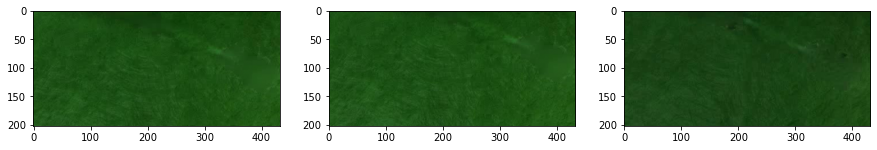

(2, 202, 432, 3)
Var (Frame0): 0.005444655238815013
frame: 0 frame: 1
Max-min frame values: 0.38823529411764707 - 0.0


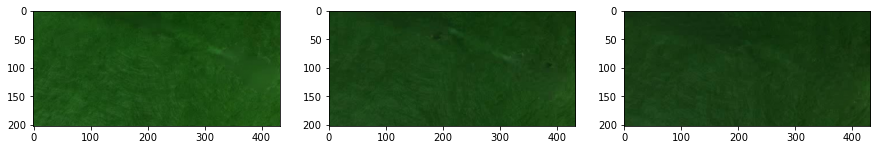

(2, 202, 432, 3)
Var (Frame1): 0.005378575727707355
frame: 0 frame: 2
Max-min frame values: 0.4588235294117647 - 0.011764705882352941


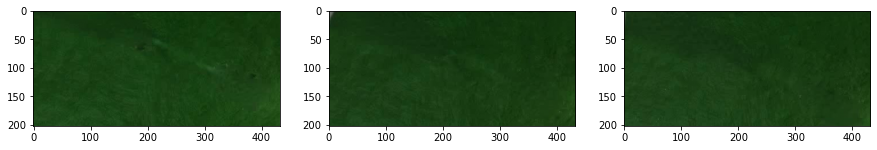

(2, 202, 432, 3)
Var (Frame2): 0.005094297648613092
frame: 1 frame: 3
Max-min frame values: 0.4196078431372549 - 0.00392156862745098


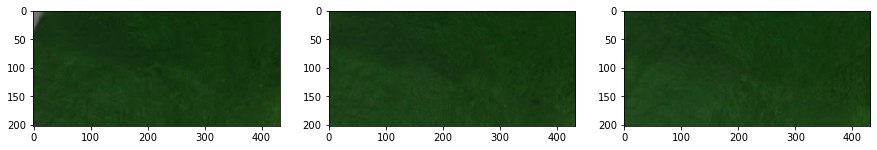

(2, 202, 432, 3)
Var (Frame3): 0.005794816262925557
frame: 2 frame: 4
Max-min frame values: 0.41568627450980394 - 0.00784313725490196


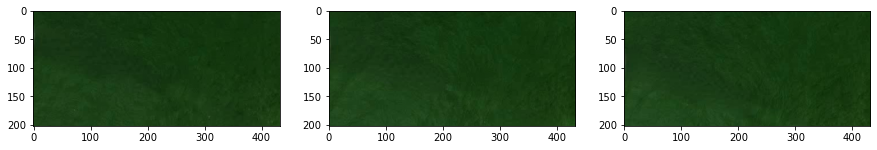

(2, 202, 432, 3)
Var (Frame4): 0.003941847136563222
frame: 3 frame: 5
Max-min frame values: 0.3568627450980392 - 0.00784313725490196


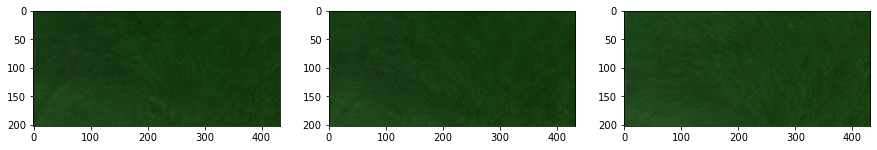

(2, 202, 432, 3)
Var (Frame5): 0.0041168462357701035
frame: 4 frame: 6
Max-min frame values: 0.4627450980392157 - 0.01568627450980392


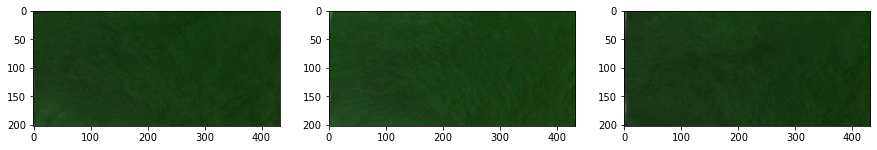

(2, 202, 432, 3)
Var (Frame6): 0.0045403386775913525
frame: 5 frame: 7
Max-min frame values: 0.47058823529411764 - 0.01568627450980392


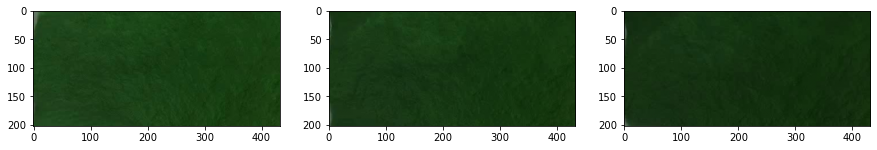

(2, 202, 432, 3)
Var (Frame7): 0.005175296757207669
frame: 6 frame: 8
Max-min frame values: 0.45098039215686275 - 0.011764705882352941


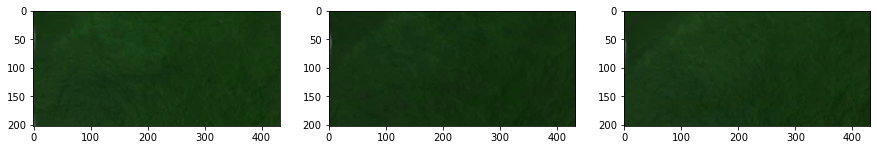

(2, 202, 432, 3)
Var (Frame8): 0.0037412672543393876
frame: 7 frame: 9
Max-min frame values: 0.43137254901960786 - 0.01568627450980392


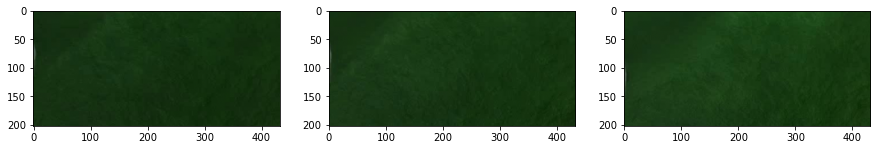

(2, 202, 432, 3)
Var (Frame9): 0.004125222044898494
frame: 8 frame: 10
Max-min frame values: 0.4588235294117647 - 0.01568627450980392


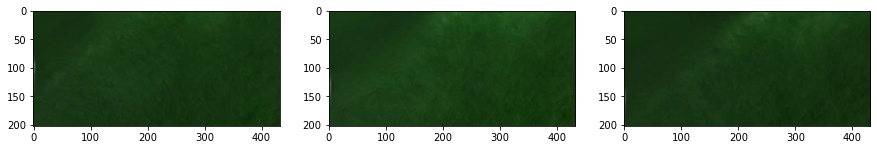

(2, 202, 432, 3)
Var (Frame10): 0.004837528310749203
frame: 9 frame: 11
Max-min frame values: 0.44313725490196076 - 0.00784313725490196


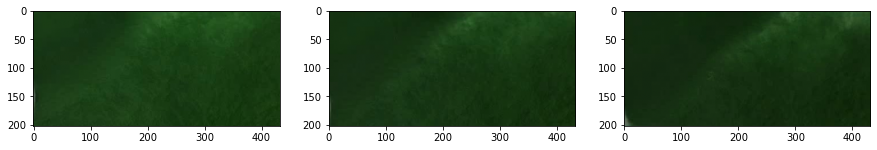

(2, 202, 432, 3)
Var (Frame11): 0.00737119957291507
frame: 10 frame: 12
Max-min frame values: 0.4745098039215686 - 0.011764705882352941


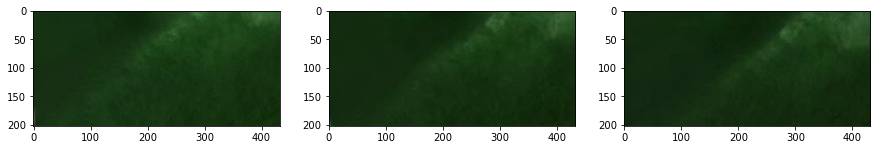

(2, 202, 432, 3)
Var (Frame12): 0.008439532802408164
frame: 11 frame: 13
Max-min frame values: 0.41568627450980394 - 0.0196078431372549


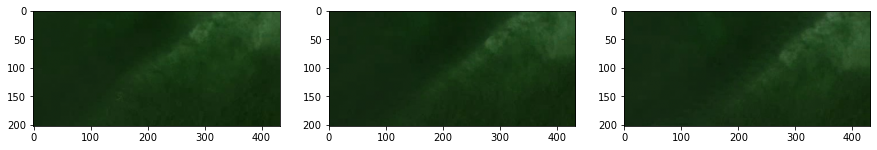

(2, 202, 432, 3)
Var (Frame13): 0.009096634866792819
frame: 12 frame: 14
Max-min frame values: 0.45098039215686275 - 0.023529411764705882


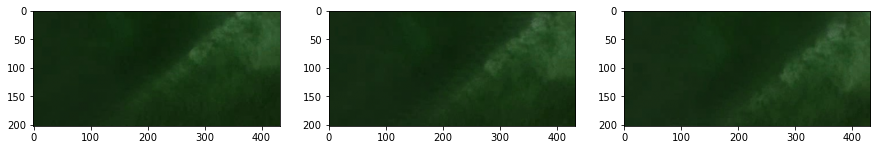

(2, 202, 432, 3)
Var (Frame14): 0.009539328389668719
frame: 13 frame: 15
Max-min frame values: 0.4666666666666667 - 0.0392156862745098


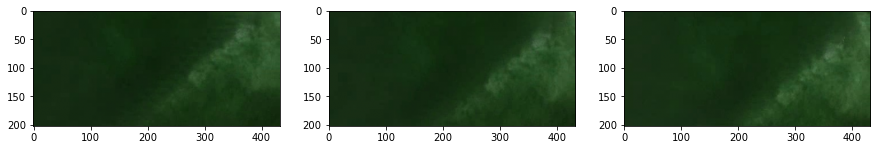

(2, 202, 432, 3)
Var (Frame15): 0.008162472564601755
frame: 14 frame: 16
Max-min frame values: 0.4823529411764706 - 0.03529411764705882


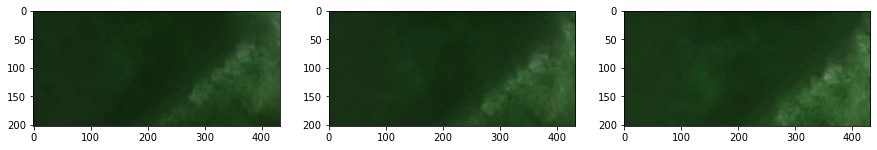

(2, 202, 432, 3)
Var (Frame16): 0.008945265826120197
frame: 15 frame: 17
Max-min frame values: 0.5764705882352941 - 0.03137254901960784


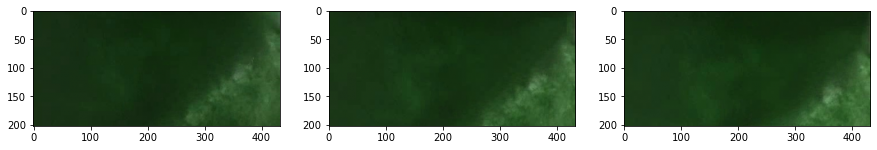

(2, 202, 432, 3)
Var (Frame17): 0.009596013789020943
frame: 16 frame: 18
Max-min frame values: 0.6078431372549019 - 0.03529411764705882


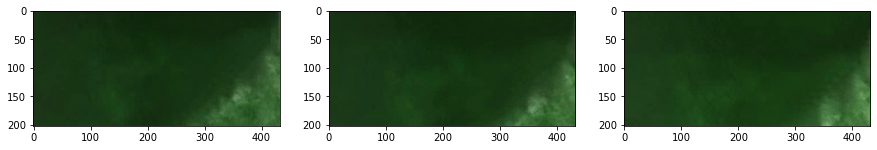

(2, 202, 432, 3)
Var (Frame18): 0.0080216995805263
frame: 17 frame: 19
Max-min frame values: 0.6352941176470588 - 0.027450980392156862


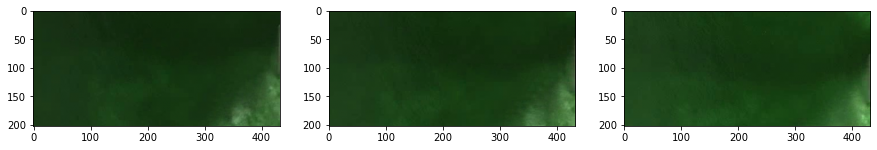

(2, 202, 432, 3)
Var (Frame19): 0.006132122208498189
frame: 18 frame: 20
Max-min frame values: 0.792156862745098 - 0.03137254901960784


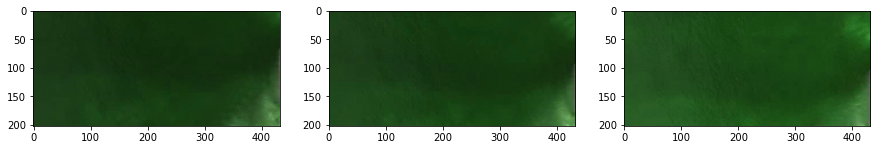

(2, 202, 432, 3)
Var (Frame20): 0.0047470783533937275
frame: 19 frame: 21
Max-min frame values: 0.5882352941176471 - 0.03137254901960784


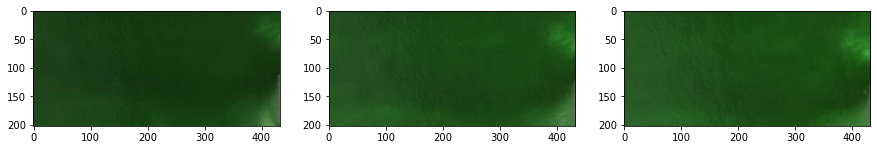

(2, 202, 432, 3)
Var (Frame21): 0.0033317589513761074
frame: 20 frame: 22
Max-min frame values: 0.6470588235294118 - 0.0196078431372549


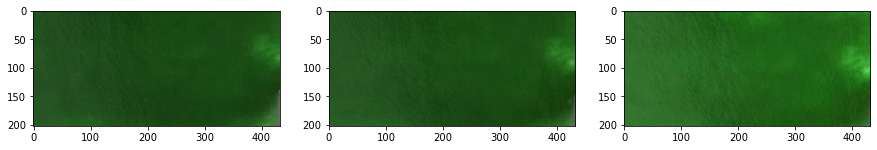

(2, 202, 432, 3)
Var (Frame22): 0.0034970317554711954
frame: 21 frame: 23
Max-min frame values: 0.8666666666666667 - 0.011764705882352941


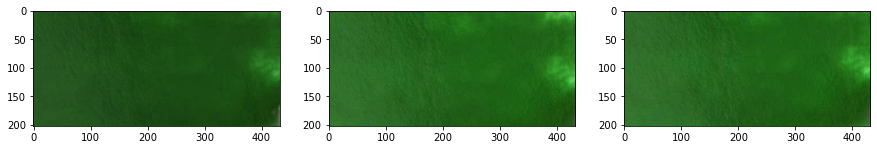

(2, 202, 432, 3)
Var (Frame23): 0.004412821488384083
frame: 22 frame: 23
Max-min frame values: 0.9803921568627451 - 0.09803921568627451


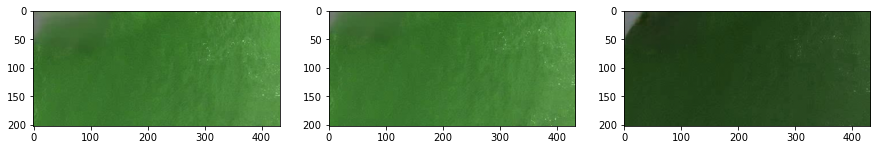

(2, 202, 432, 3)
Var (Frame0): 0.0038828443739801362
frame: 0 frame: 1
Max-min frame values: 0.611764705882353 - 0.03137254901960784


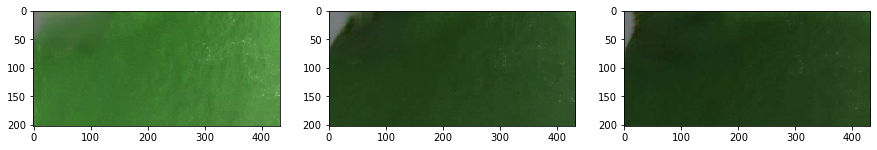

(2, 202, 432, 3)
Var (Frame1): 0.0072452027002552506
frame: 0 frame: 2
Max-min frame values: 0.48627450980392156 - 0.0196078431372549


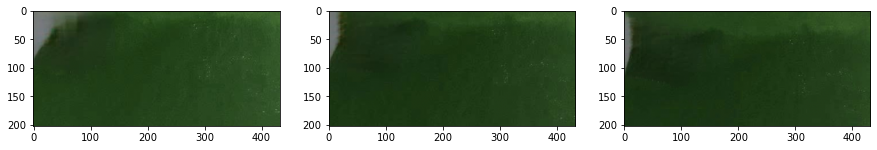

(2, 202, 432, 3)
Var (Frame2): 0.008439530655824814
frame: 1 frame: 3
Max-min frame values: 0.47843137254901963 - 0.027450980392156862


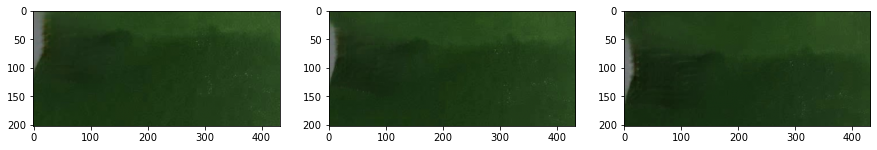

(2, 202, 432, 3)
Var (Frame3): 0.009375630816489114
frame: 2 frame: 4
Max-min frame values: 0.5058823529411764 - 0.00392156862745098


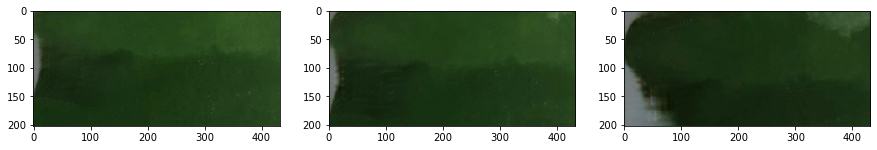

(2, 202, 432, 3)
Var (Frame4): 0.0428066863636062
frame: 3 frame: 5
Max-min frame values: 0.5215686274509804 - 0.0


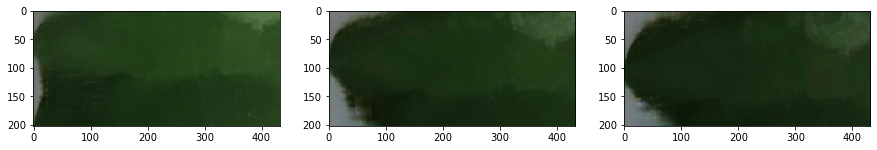

(2, 202, 432, 3)
Var (Frame5): 0.03950784358602609
frame: 4 frame: 6
Max-min frame values: 0.5843137254901961 - 0.011764705882352941


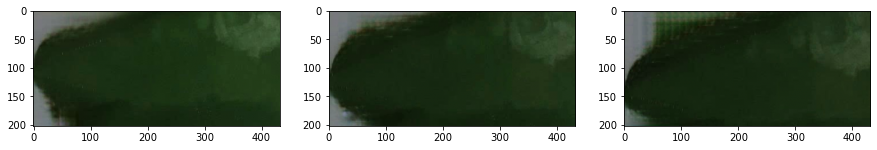

(2, 202, 432, 3)
Var (Frame6): 0.026600187734964705
frame: 5 frame: 7
Max-min frame values: 0.5058823529411764 - 0.0


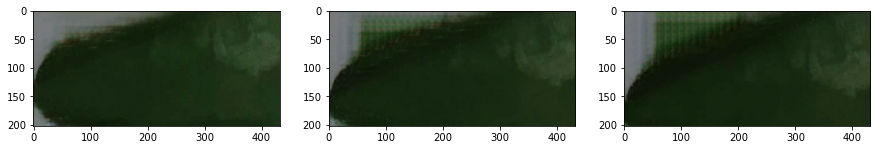

(2, 202, 432, 3)
Var (Frame7): 0.02256296183329234
frame: 6 frame: 8
Max-min frame values: 0.5058823529411764 - 0.0


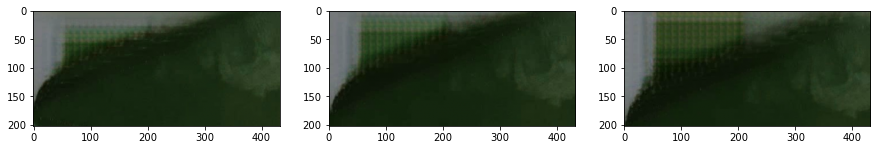

(2, 202, 432, 3)
Var (Frame8): 0.017057777569204208
frame: 7 frame: 9
Max-min frame values: 0.5411764705882353 - 0.0


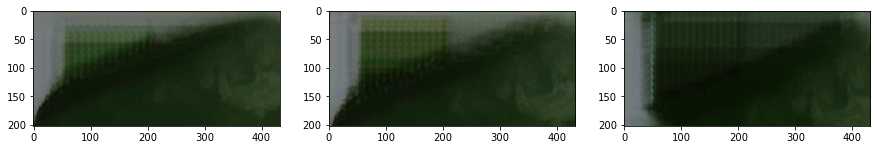

(2, 202, 432, 3)
Var (Frame9): 0.04105457257991819
frame: 8 frame: 10
Max-min frame values: 0.5215686274509804 - 0.0


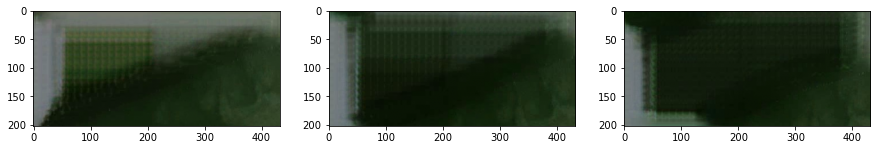

(2, 202, 432, 3)
Var (Frame10): 0.06416244927002135
frame: 9 frame: 11
Max-min frame values: 0.5215686274509804 - 0.0


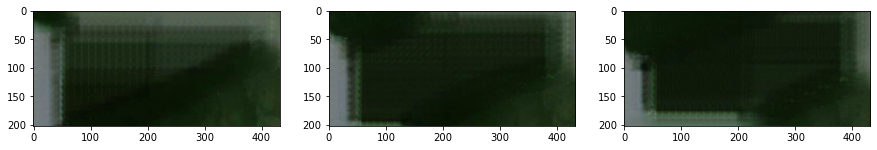

(2, 202, 432, 3)
Var (Frame11): 0.07932243109515985
frame: 10 frame: 12
Max-min frame values: 0.5215686274509804 - 0.0


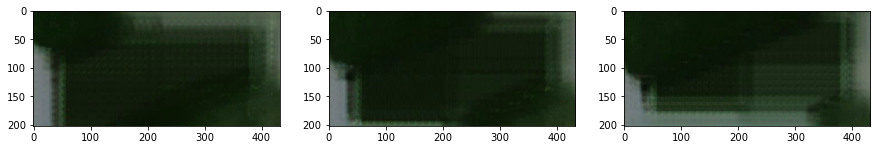

(2, 202, 432, 3)
Var (Frame12): 0.08856011123604031
frame: 11 frame: 13
Max-min frame values: 0.5176470588235295 - 0.0


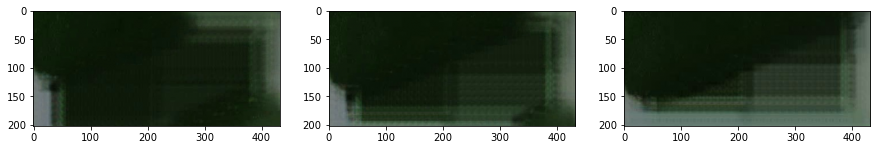

(2, 202, 432, 3)
Var (Frame13): 0.07856463198050856
frame: 12 frame: 14
Max-min frame values: 0.5137254901960784 - 0.0


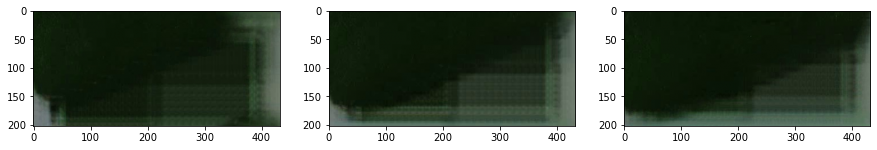

(2, 202, 432, 3)
Var (Frame14): 0.05217982341610115
frame: 13 frame: 15
Max-min frame values: 0.49019607843137253 - 0.0


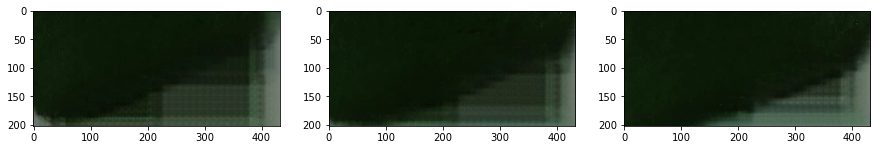

(2, 202, 432, 3)
Var (Frame15): 0.03319711699777661
frame: 14 frame: 16
Max-min frame values: 0.5098039215686274 - 0.0


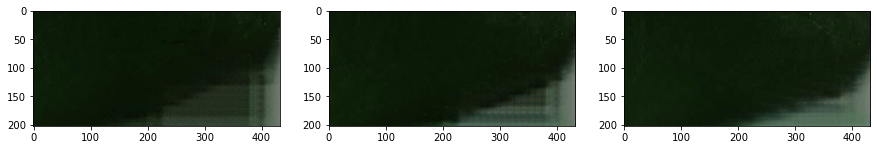

(2, 202, 432, 3)
Var (Frame16): 0.023291424143260114
frame: 15 frame: 17
Max-min frame values: 0.5137254901960784 - 0.0


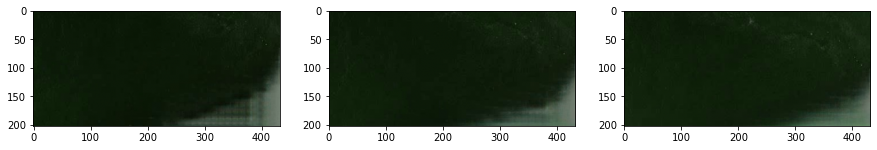

(2, 202, 432, 3)
Var (Frame17): 0.01707232325513508
frame: 16 frame: 18
Max-min frame values: 0.5019607843137255 - 0.0


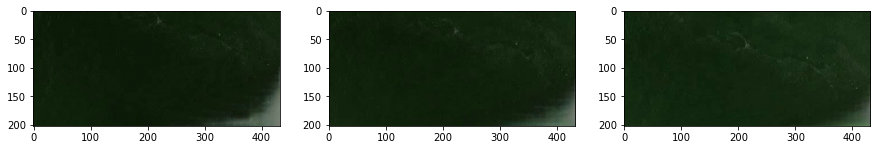

(2, 202, 432, 3)
Var (Frame18): 0.018163772315499614
frame: 17 frame: 19
Max-min frame values: 0.48627450980392156 - 0.0196078431372549


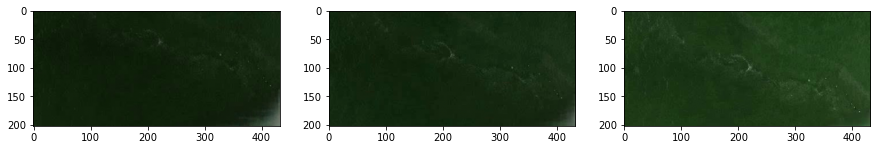

(2, 202, 432, 3)
Var (Frame19): 0.011723322783540166
frame: 18 frame: 20
Max-min frame values: 0.6823529411764706 - 0.027450980392156862


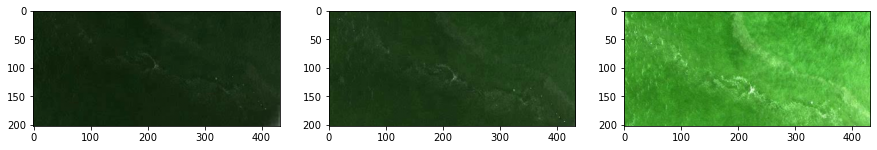

(2, 202, 432, 3)
Var (Frame20): 0.009814285632777284
frame: 19 frame: 21
Max-min frame values: 1.0 - 0.03137254901960784


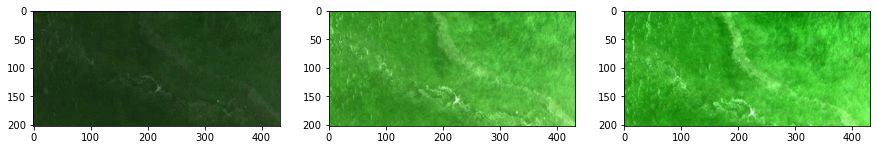

(2, 202, 432, 3)
Var (Frame21): 0.014562752081496353
frame: 20 frame: 22
Max-min frame values: 1.0 - 0.0


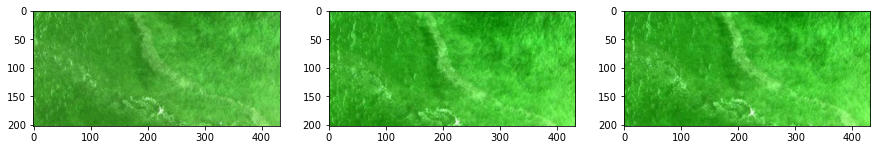

(2, 202, 432, 3)
Var (Frame22): 0.015353829137750762
frame: 21 frame: 22
Max-min frame values: 1.0 - 0.0


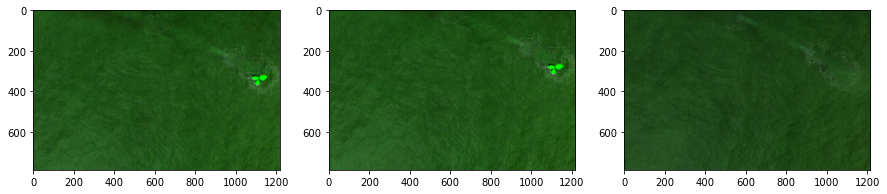

(2, 788, 1216, 3)
Var (Frame0): 0.015344221908225429
frame: 0 frame: 1
Max-min frame values: 0.5607843137254902 - 0.0


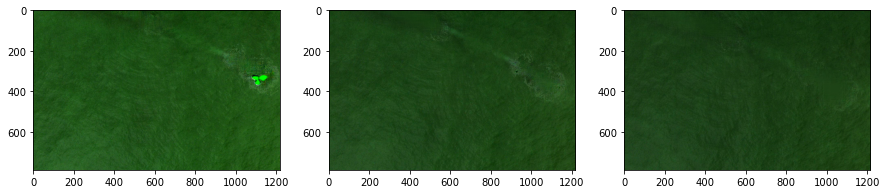

(2, 788, 1216, 3)
Var (Frame1): 0.011810479704227187
frame: 0 frame: 2
Max-min frame values: 0.41568627450980394 - 0.00392156862745098


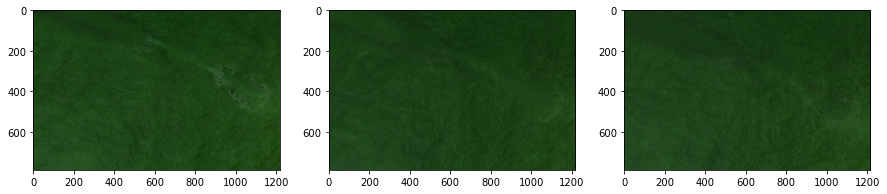

(2, 788, 1216, 3)
Var (Frame2): 0.008881166583031827
frame: 1 frame: 3
Max-min frame values: 0.3803921568627451 - 0.00392156862745098


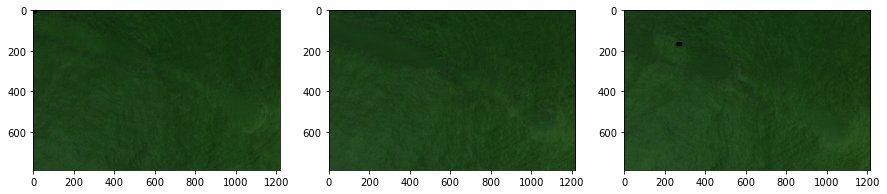

(2, 788, 1216, 3)
Var (Frame3): 0.008645608537213011
frame: 2 frame: 4
Max-min frame values: 0.592156862745098 - 0.0


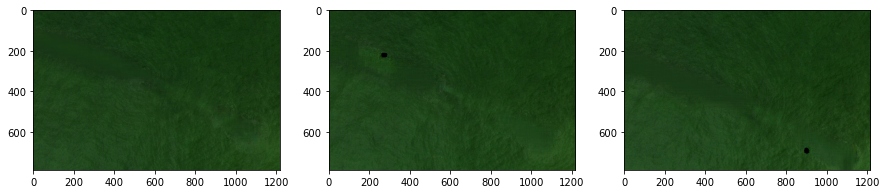

(2, 788, 1216, 3)
Var (Frame4): 0.009163773425389331
frame: 3 frame: 5
Max-min frame values: 0.47843137254901963 - 0.0


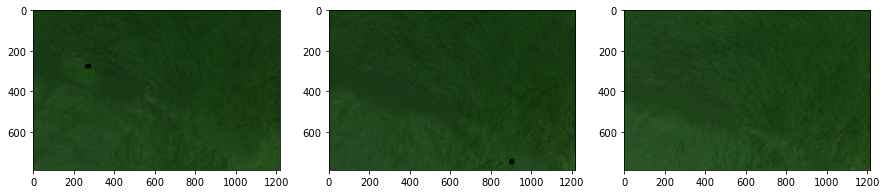

(2, 788, 1216, 3)
Var (Frame5): 0.009331045384004671
frame: 4 frame: 6
Max-min frame values: 0.43529411764705883 - 0.00392156862745098


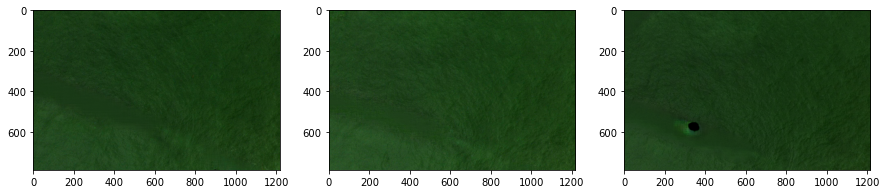

(2, 788, 1216, 3)
Var (Frame6): 0.008503986251307181
frame: 5 frame: 7
Max-min frame values: 0.4470588235294118 - 0.0


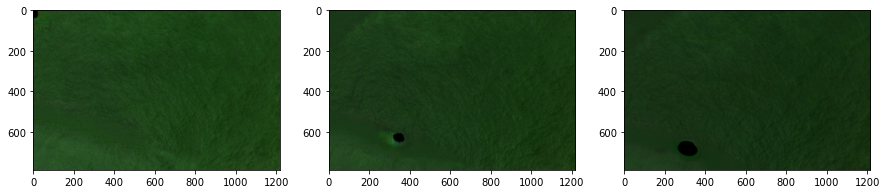

(2, 788, 1216, 3)
Var (Frame7): 0.009032323726254109
frame: 6 frame: 8
Max-min frame values: 0.3058823529411765 - 0.0


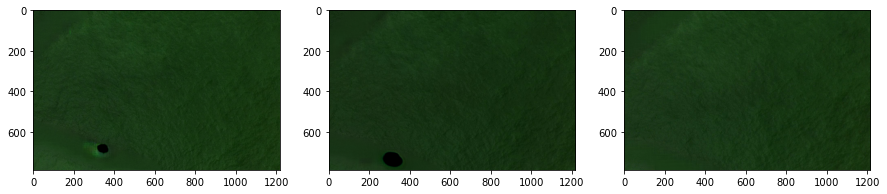

(2, 788, 1216, 3)
Var (Frame8): 0.008637381871535406
frame: 7 frame: 9
Max-min frame values: 0.39215686274509803 - 0.00784313725490196


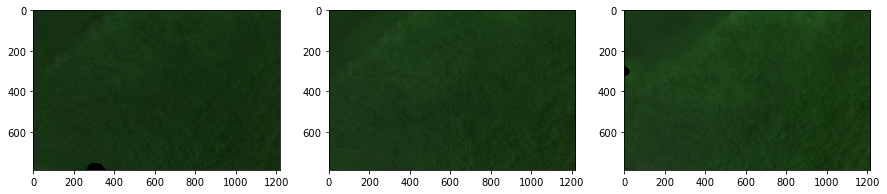

(2, 788, 1216, 3)
Var (Frame9): 0.007095416416837689
frame: 8 frame: 10
Max-min frame values: 0.43137254901960786 - 0.0


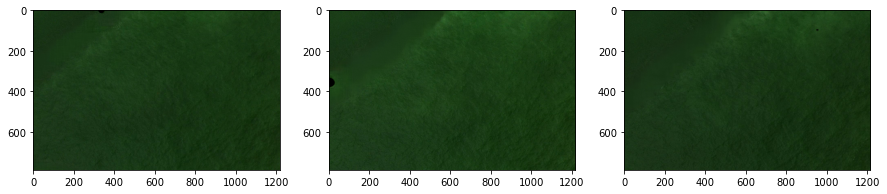

(2, 788, 1216, 3)
Var (Frame10): 0.007321404829341318
frame: 9 frame: 11
Max-min frame values: 0.42745098039215684 - 0.0


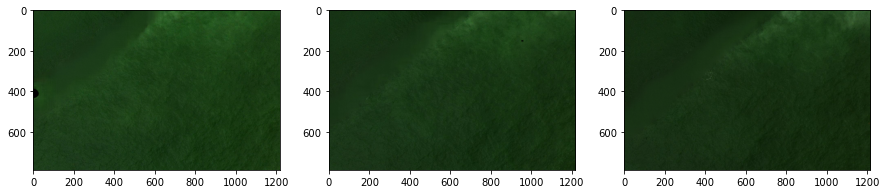

(2, 788, 1216, 3)
Var (Frame11): 0.007796109052984818
frame: 10 frame: 12
Max-min frame values: 0.5294117647058824 - 0.00784313725490196


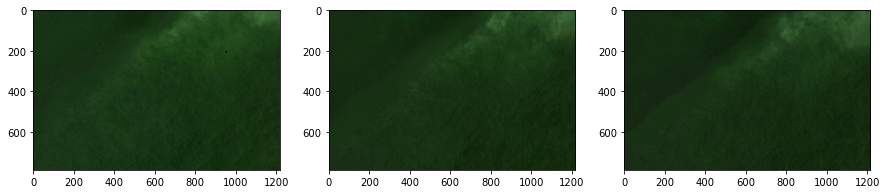

(2, 788, 1216, 3)
Var (Frame12): 0.008299228960546133
frame: 11 frame: 13
Max-min frame values: 0.4392156862745098 - 0.01568627450980392


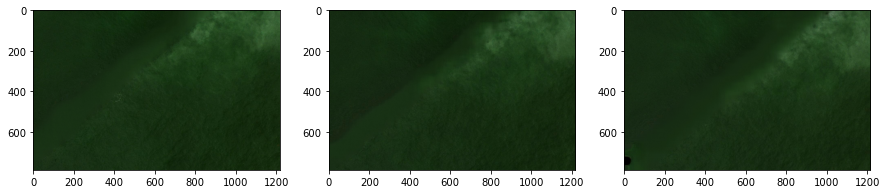

(2, 788, 1216, 3)
Var (Frame13): 0.009426581601708282
frame: 12 frame: 14
Max-min frame values: 0.4745098039215686 - 0.0


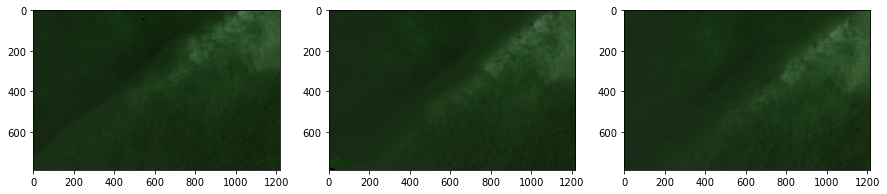

(2, 788, 1216, 3)
Var (Frame14): 0.009918947489082475
frame: 13 frame: 15
Max-min frame values: 0.5019607843137255 - 0.0196078431372549


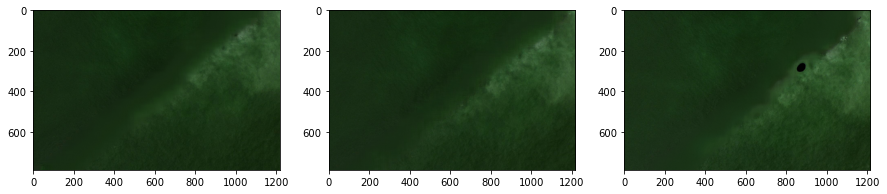

(2, 788, 1216, 3)
Var (Frame15): 0.008634879835983676
frame: 14 frame: 16
Max-min frame values: 0.7098039215686275 - 0.0


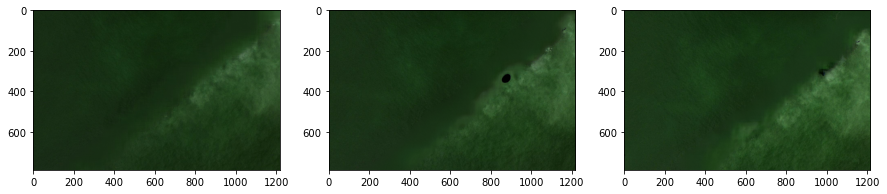

(2, 788, 1216, 3)
Var (Frame16): 0.010774165539045668
frame: 15 frame: 17
Max-min frame values: 0.6196078431372549 - 0.0


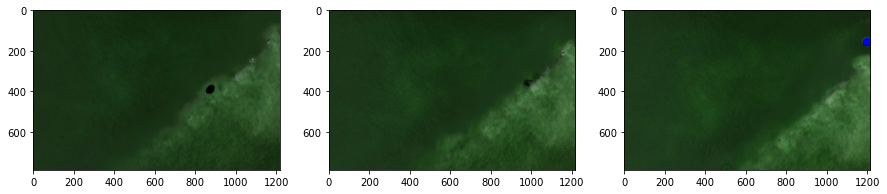

(2, 788, 1216, 3)
Var (Frame17): 0.016221295472072874
frame: 16 frame: 18
Max-min frame values: 1.0 - 0.0


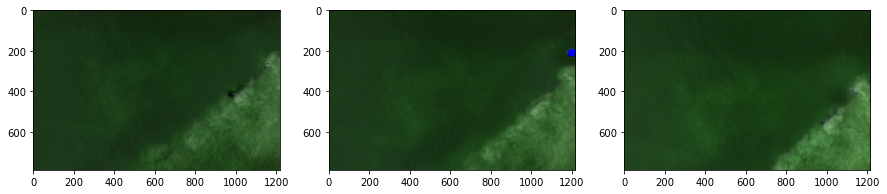

(2, 788, 1216, 3)
Var (Frame18): 0.02010863077076745
frame: 17 frame: 19
Max-min frame values: 0.8823529411764706 - 0.00784313725490196


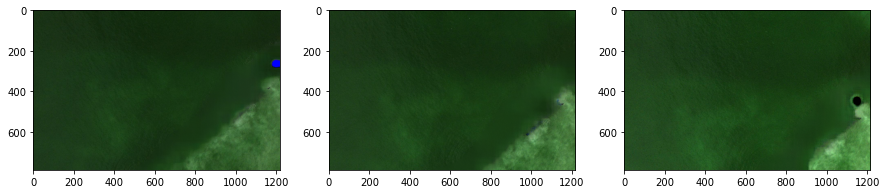

(2, 788, 1216, 3)
Var (Frame19): 0.020619087730786363
frame: 18 frame: 20
Max-min frame values: 0.8862745098039215 - 0.0


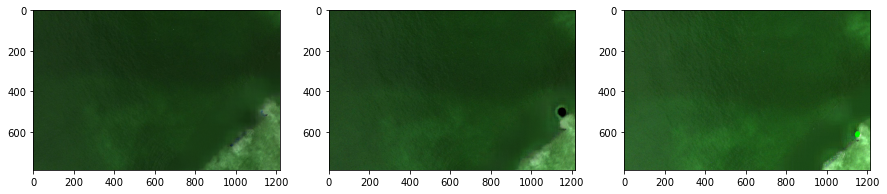

(2, 788, 1216, 3)
Var (Frame20): 0.01766783440240513
frame: 19 frame: 21
Max-min frame values: 1.0 - 0.0


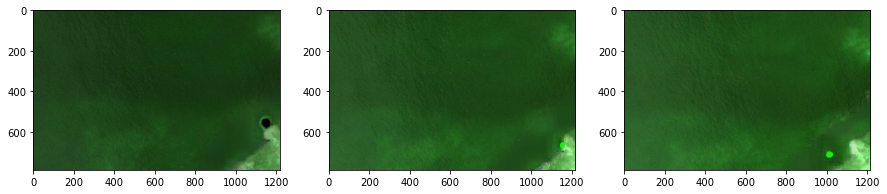

(2, 788, 1216, 3)
Var (Frame21): 0.012774154393082795
frame: 20 frame: 22
Max-min frame values: 1.0 - 0.0


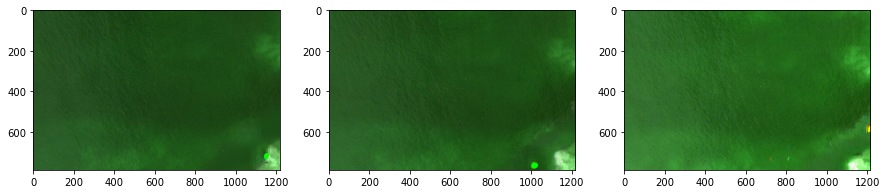

(2, 788, 1216, 3)
Var (Frame22): 0.012211107130097829
frame: 21 frame: 23
Max-min frame values: 1.0 - 0.0


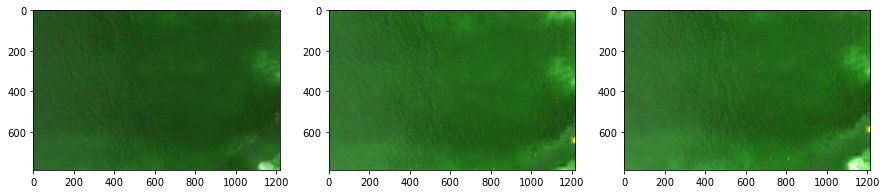

(2, 788, 1216, 3)
Var (Frame23): 0.013836754436482088
frame: 22 frame: 23
Max-min frame values: 0.996078431372549 - 0.07450980392156863


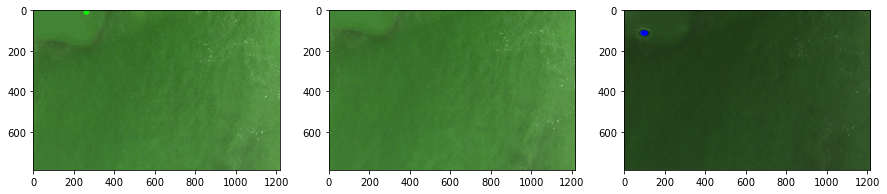

(2, 788, 1216, 3)
Var (Frame0): 0.0038966076257970655
frame: 0 frame: 1
Max-min frame values: 1.0 - 0.0


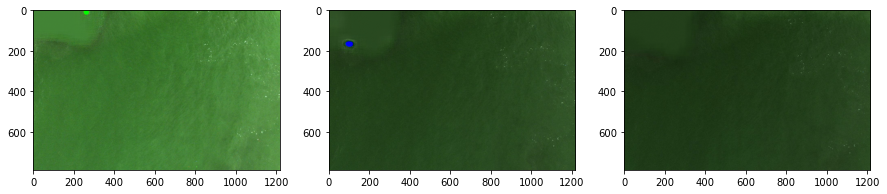

(2, 788, 1216, 3)
Var (Frame1): 0.0051001081628318295
frame: 0 frame: 2
Max-min frame values: 0.7803921568627451 - 0.027450980392156862


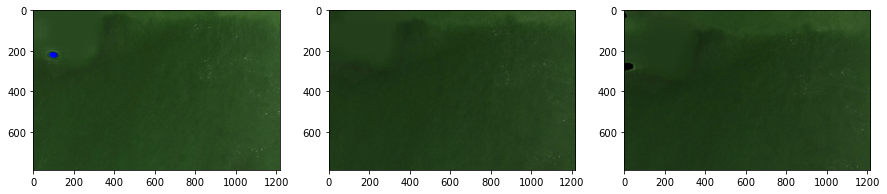

(2, 788, 1216, 3)
Var (Frame2): 0.004774736291609572
frame: 1 frame: 3
Max-min frame values: 0.803921568627451 - 0.0


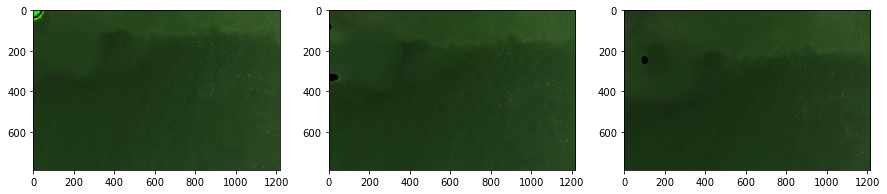

(2, 788, 1216, 3)
Var (Frame3): 0.005832158600398707
frame: 2 frame: 4
Max-min frame values: 0.6980392156862745 - 0.0


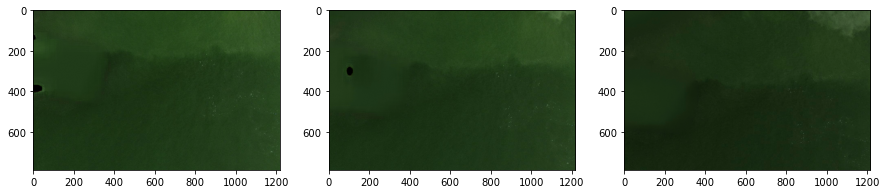

(2, 788, 1216, 3)
Var (Frame4): 0.00596457112132398
frame: 3 frame: 5
Max-min frame values: 0.5686274509803921 - 0.027450980392156862


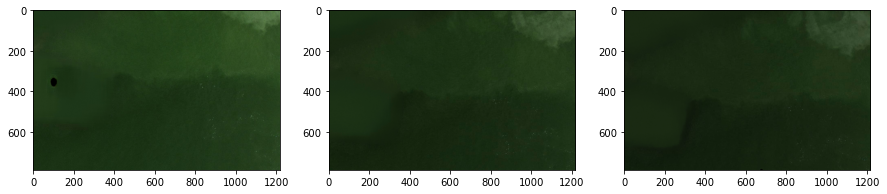

(2, 788, 1216, 3)
Var (Frame5): 0.005863977855201676
frame: 4 frame: 6
Max-min frame values: 0.396078431372549 - 0.03137254901960784


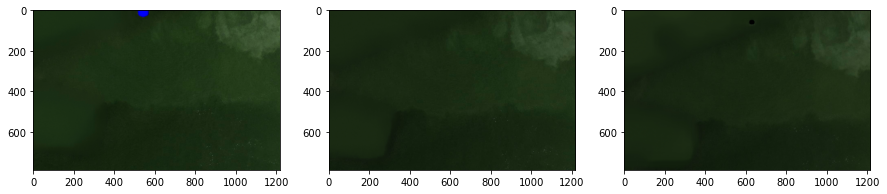

(2, 788, 1216, 3)
Var (Frame6): 0.008187407563339463
frame: 5 frame: 7
Max-min frame values: 0.3843137254901961 - 0.0


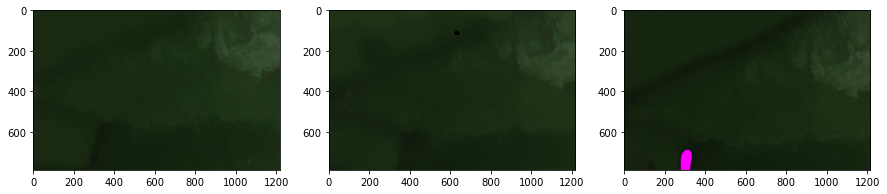

(2, 788, 1216, 3)
Var (Frame7): 0.03393962207453633
frame: 6 frame: 8
Max-min frame values: 1.0 - 0.0


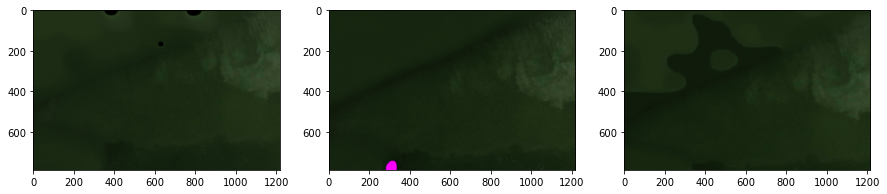

(2, 788, 1216, 3)
Var (Frame8): 0.03241037704639652
frame: 7 frame: 9
Max-min frame values: 0.3176470588235294 - 0.0


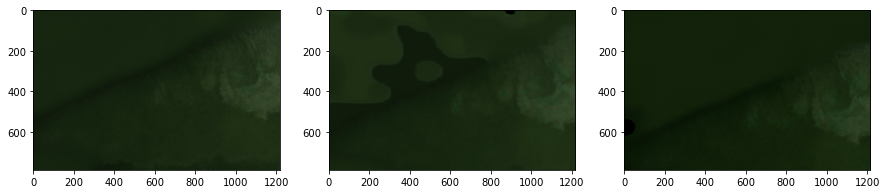

(2, 788, 1216, 3)
Var (Frame9): 0.012077217497628202
frame: 8 frame: 10
Max-min frame values: 0.2901960784313726 - 0.0


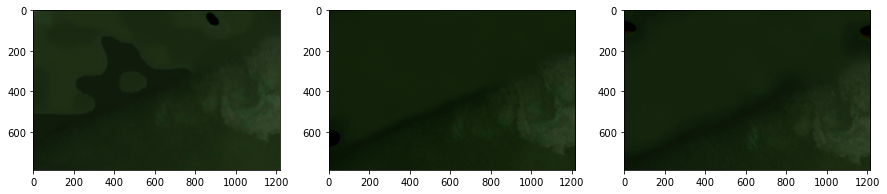

(2, 788, 1216, 3)
Var (Frame10): 0.012541890523135866
frame: 9 frame: 11
Max-min frame values: 0.2980392156862745 - 0.0


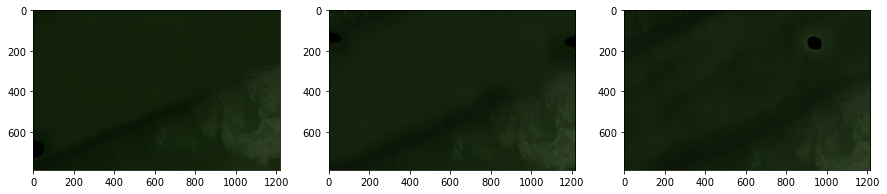

(2, 788, 1216, 3)
Var (Frame11): 0.00926235407747032
frame: 10 frame: 12
Max-min frame values: 0.30196078431372547 - 0.0


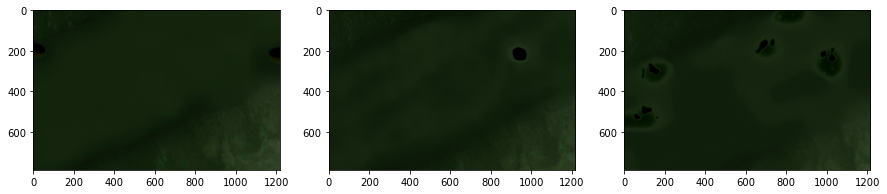

(2, 788, 1216, 3)
Var (Frame12): 0.01153814621184632
frame: 11 frame: 13
Max-min frame values: 0.26666666666666666 - 0.0


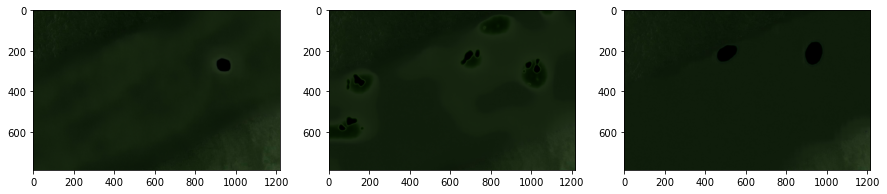

(2, 788, 1216, 3)
Var (Frame13): 0.015502103294947403
frame: 12 frame: 14
Max-min frame values: 0.3176470588235294 - 0.0


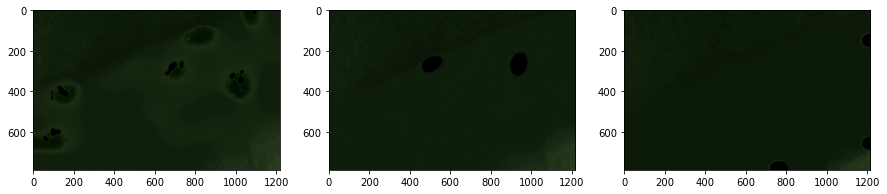

(2, 788, 1216, 3)
Var (Frame14): 0.015805397980995048
frame: 13 frame: 15
Max-min frame values: 0.8313725490196079 - 0.0


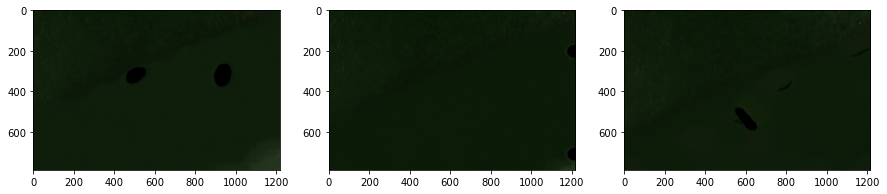

(2, 788, 1216, 3)
Var (Frame15): 0.011412780119144681
frame: 14 frame: 16
Max-min frame values: 0.7568627450980392 - 0.0


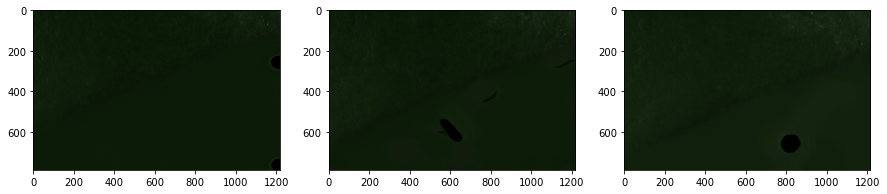

(2, 788, 1216, 3)
Var (Frame16): 0.010213055561645026
frame: 15 frame: 17
Max-min frame values: 0.7294117647058823 - 0.0


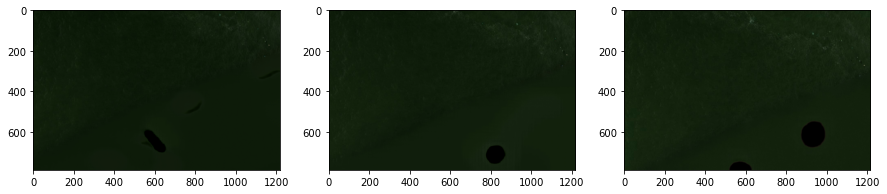

(2, 788, 1216, 3)
Var (Frame17): 0.013223442928945698
frame: 16 frame: 18
Max-min frame values: 0.796078431372549 - 0.0


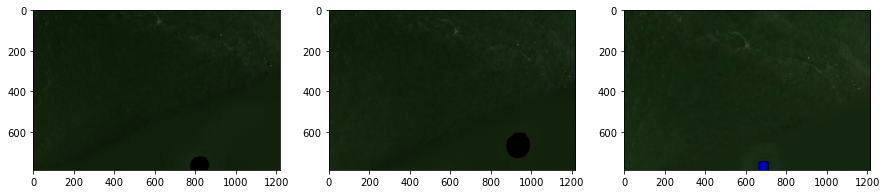

(2, 788, 1216, 3)
Var (Frame18): 0.01565234503594018
frame: 17 frame: 19
Max-min frame values: 0.8313725490196079 - 0.01568627450980392


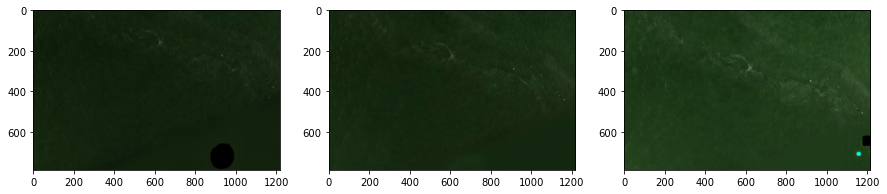

(2, 788, 1216, 3)
Var (Frame19): 0.01015847201586079
frame: 18 frame: 20
Max-min frame values: 0.996078431372549 - 0.0


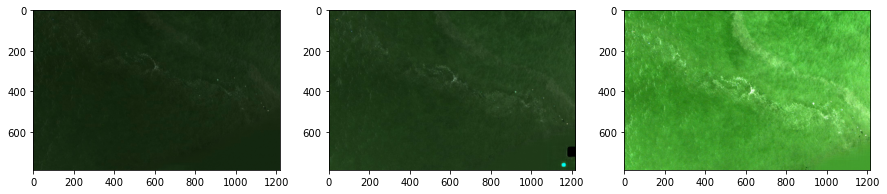

(2, 788, 1216, 3)
Var (Frame20): 0.01191635108235699
frame: 19 frame: 21
Max-min frame values: 0.996078431372549 - 0.00392156862745098


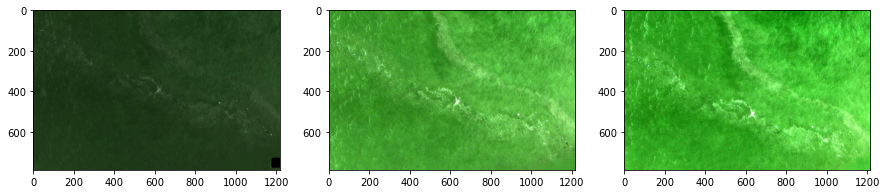

(2, 788, 1216, 3)
Var (Frame21): 0.015783262939019174
frame: 20 frame: 22
Max-min frame values: 1.0 - 0.0


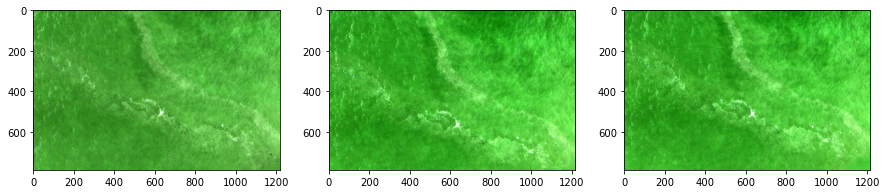

(2, 788, 1216, 3)
Var (Frame22): 0.017066225974343305
frame: 21 frame: 22


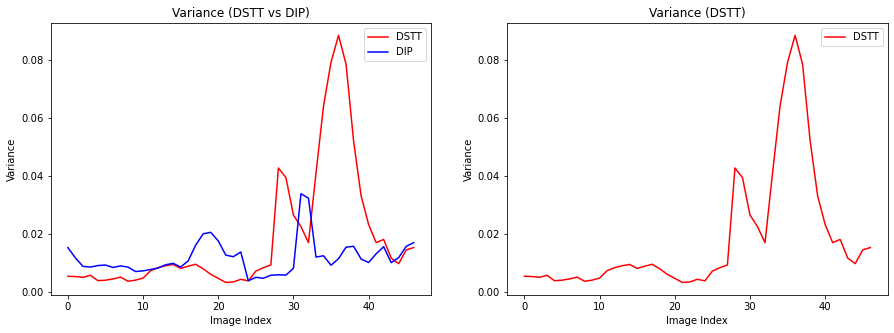

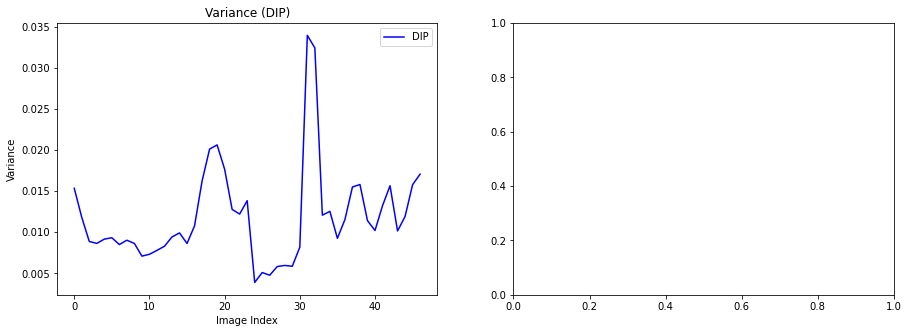

Average VAR score: 0.018467769425595446
Average VAR score: 0.011918685043343128


In [13]:
variance_list_1 = variance('ORG_DSTT_Normalised_line1','INPAINTED_DSTT_Normalised_Line1','ANNOTATIONS_DSTT_shadow_Line1')
variance_list_2 = variance('ORG_DSTT_Normalised_Line10','INPAINTED_DSTT_Normalised_Line10','ANNOTATIONS_DSTT_shadow_Line10')

variance_list_3 = variance_DIP('ORG_DIP_Normalised_Line1','INPAINTED_DIP_Normalised_Line1','ANNOTATIONS_DIP_shadow_Line1')
variance_list_4 = variance_DIP('ORG_DIP_Normalised_Line10','INPAINTED_DIP_Normalised_Line10','ANNOTATIONS_DIP_shadow_Line10')

DSTT_list = variance_list_1 + variance_list_2
DIP_list = variance_list_3 + variance_list_4

plot_metrics(DSTT_list,DIP_list)
Average_var(DSTT_list)
Average_var(DIP_list)


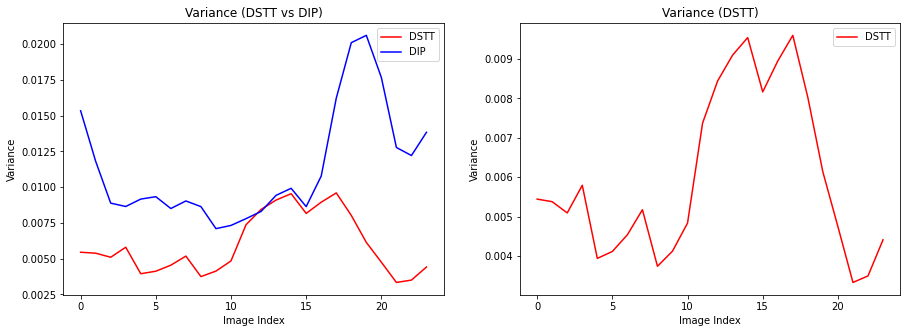

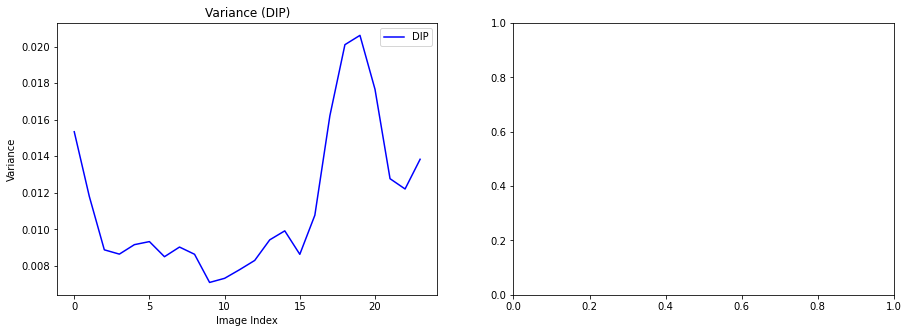

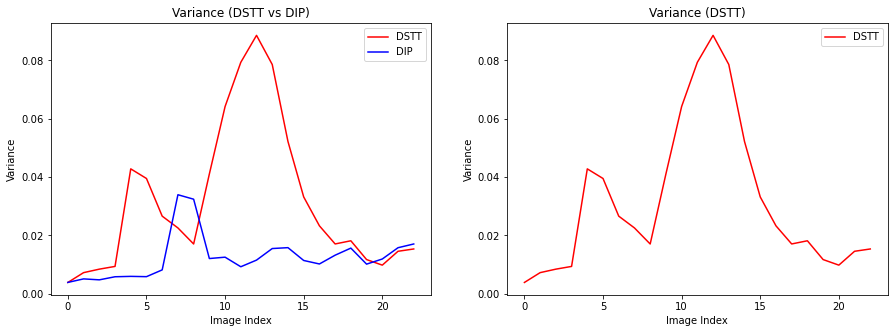

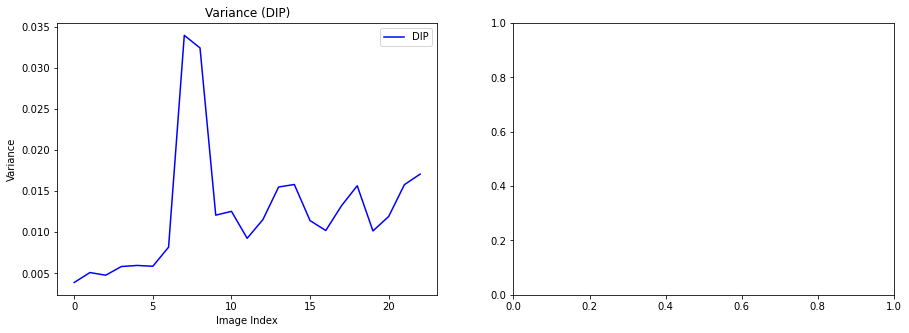

Average VAR score: 0.005978485476848239
Average VAR score: 0.011335649393850532
Average VAR score: 0.03150006571994036
Average VAR score: 0.012527070068900614


In [9]:
plot_metrics(variance_list_1,variance_list_3)
plot_metrics(variance_list_2,variance_list_4)
Average_var(variance_list_1)
Average_var(variance_list_3)

Average_var(variance_list_2)
Average_var(variance_list_4)

# Obstacle Coverage Percentage

For Section 3.2.3.1 and 3.2.3.2.

In [15]:
def get_mask_coverage(mask):
    total_pixels = mask.shape[0] * mask.shape[1]
    masked_pixels = np.count_nonzero(mask)
    coverage_percentage = (masked_pixels / total_pixels) * 100
    return coverage_percentage

def coverage_percentage(mask_folder):
    
    coverage_list = []
    mask_img_list = os.listdir(mask_folder)
    
    for i in range(len(mask_img_list)):
        
        mask_img = cv2.imread(os.path.join(mask_folder, mask_img_list[i]), cv2.IMREAD_GRAYSCALE)
        coverage_percentage = get_mask_coverage(mask_img)
        coverage_list.append(coverage_percentage)
    
    return coverage_list

def Average_coverage(coverage_list):
    total_coverage = sum(coverage for coverage in coverage_list)
    mean_coverage = total_coverage / len(coverage_list)
    min_coverage = min(coverage_list)
    max_coverage = max(coverage_list)
    
    print(f"Average Coverage Percentage: {mean_coverage}")
    print(f"Minimum Coverage Percentage: {min_coverage}")
    print(f"Maximum Coverage Percentage: {max_coverage}")
    
    

In [16]:
def plot_correlation(coverage_list_1, coverage_list_2, variance_list_1, variance_list_2):
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    ax[0].plot(coverage_list_1, c='r',label='DSTT')
    ax[0].plot(coverage_list_2, c='b',label='DIP')
    ax[0].legend()
    ax[0].set_ylabel("Coverage Percentage")
    ax[0].set_xlabel("Image Index")
    ax[0].set_title("Coverage Percentage (DSTT vs DIP)")
    
    ax[1].plot([var for var in variance_list_1], c='r',label='DSTT')
    ax[1].plot([var for var in variance_list_2], c='b',label='DIP')
    ax[1].legend()
    ax[1].set_ylabel("Variance")
    ax[1].set_xlabel("Image Index")
    ax[1].set_title("Variance (DSTT vs DIP)")
    
    #Average_var(variance_list_1)
    #Average_var(variance_list_2)
    Average_coverage(coverage_list_1)
    Average_coverage(coverage_list_2)
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    # Scatterplot with best fit line for DSTT
    ax[0].scatter(coverage_list_1, [var.mean() for var in variance_list_1], label='Variance')
    ax[0].set_xlabel("Coverage Percentage")
    ax[0].set_ylabel("Variance")
    ax[0].set_title("Variance (DSTT) vs Coverage Percentage")
    ax[0].legend()

    # Perform linear regression for DSTT
    m1, b1 = np.polyfit(coverage_list_1, [var.mean() for var in variance_list_1], 1)
    ax[0].plot(coverage_list_1, m1 * np.array(coverage_list_1) + b1, color='black', linestyle='--', label='Best Fit Line (DSTT)')

    correlation_coefficient_line1 = compute_correlation_coefficient([var.mean() for var in variance_list_1], coverage_list_1)
    print(f"Correlation Coefficient (Variance vs Coverage Percentage) DSTT: {correlation_coefficient_line1}")

    # Scatterplot with best fit line for DIP
    ax[1].scatter(coverage_list_2, [var.mean() for var in variance_list_2], label='Variance')
    ax[1].set_xlabel("Coverage Percentage")
    ax[1].set_ylabel("Variance")
    ax[1].set_title("Variance (DIP) vs Coverage Percentage")
    ax[1].legend()

    # Perform linear regression for DIP
    m2, b2 = np.polyfit(coverage_list_2, [var.mean() for var in variance_list_2], 1)
    ax[1].plot(coverage_list_2, m2 * np.array(coverage_list_2) + b2, color='black', linestyle='--', label='Best Fit Line (DIP)')

    correlation_coefficient_line10 = compute_correlation_coefficient([var.mean() for var in variance_list_2], coverage_list_2)
    print(f"Correlation Coefficient (Variance vs Coverage Percentage) DIP: {correlation_coefficient_line10}")

    plt.show()
    
def compute_correlation_coefficient(x, y):
    correlation_matrix = np.corrcoef(x, y)
    correlation_coefficient = correlation_matrix[0, 1]
    return correlation_coefficient


In [17]:
coverage_list_1 = coverage_percentage('ANNOTATIONS_DSTT_shadow_Line1')
coverage_list_2 = coverage_percentage('ANNOTATIONS_DSTT_shadow_Line10')
coverage_list_3 = coverage_percentage('ANNOTATIONS_DIP_shadow_Line1')
coverage_list_4 = coverage_percentage('ANNOTATIONS_DIP_shadow_Line10')

DSTT_list_coverage = coverage_list_1 + coverage_list_2
DIP_list_coverage = coverage_list_3 + coverage_list_4


Average Coverage Percentage: 11.517047646604937
Minimum Coverage Percentage: 1.0792824074074074
Maximum Coverage Percentage: 20.379050925925927
Average Coverage Percentage: 11.572047642299111
Minimum Coverage Percentage: 4.150574189379699
Maximum Coverage Percentage: 20.134167205122182
Correlation Coefficient (Variance vs Coverage Percentage) DSTT: 0.8033969257821518
Correlation Coefficient (Variance vs Coverage Percentage) DIP: -0.03693208693065247


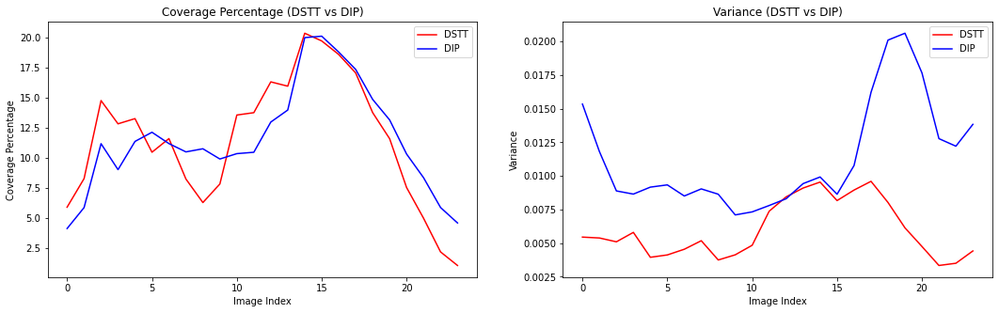

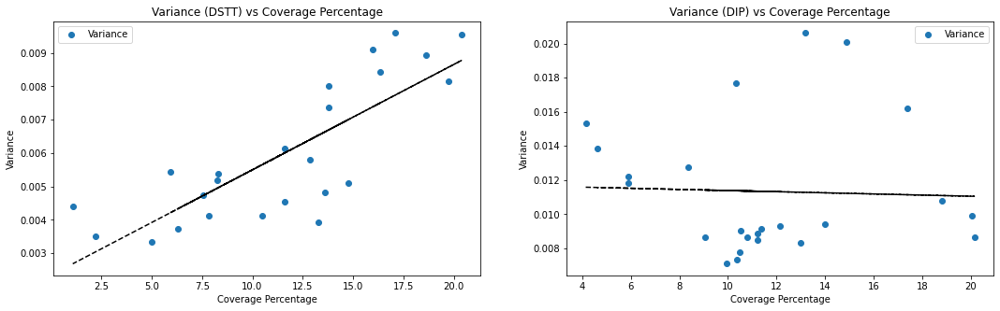

Average Coverage Percentage: 33.371410359635
Minimum Coverage Percentage: 0.0
Maximum Coverage Percentage: 82.19618055555556
Average Coverage Percentage: 33.1864685278073
Minimum Coverage Percentage: 0.9067162535244361
Maximum Coverage Percentage: 73.94120065789474
Correlation Coefficient (Variance vs Coverage Percentage) DSTT: 0.8935022085522821
Correlation Coefficient (Variance vs Coverage Percentage) DIP: 0.2294966635095597


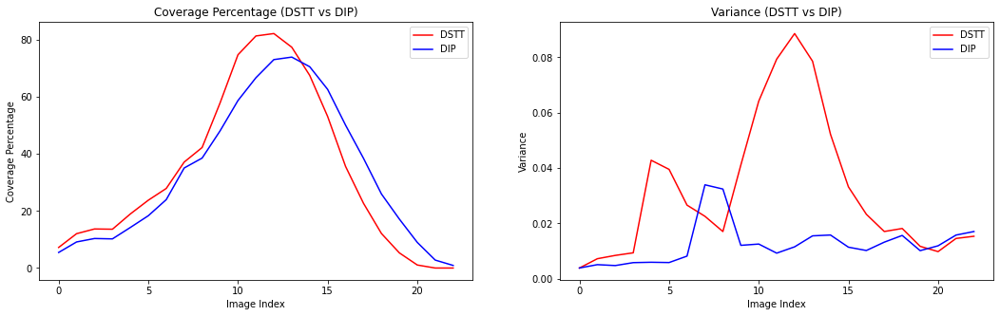

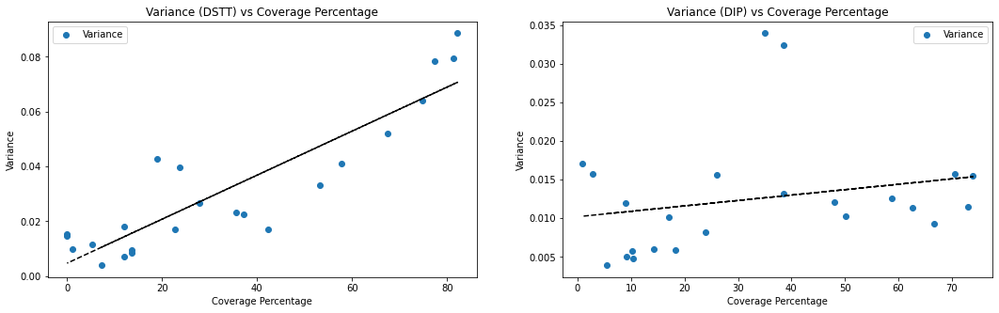

Average Coverage Percentage: 22.21173578276858
Minimum Coverage Percentage: 0.0
Maximum Coverage Percentage: 82.19618055555556
Average Coverage Percentage: 22.149317437335025
Minimum Coverage Percentage: 0.9067162535244361
Maximum Coverage Percentage: 73.94120065789474
Correlation Coefficient (Variance vs Coverage Percentage) DSTT: 0.9125561633688366
Correlation Coefficient (Variance vs Coverage Percentage) DIP: 0.21870220641607196


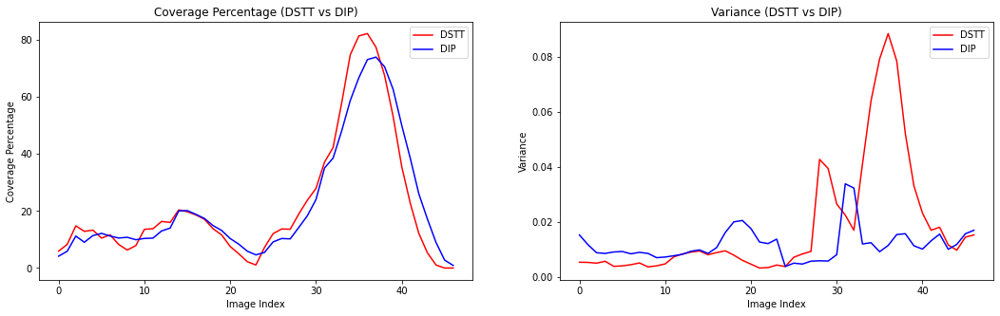

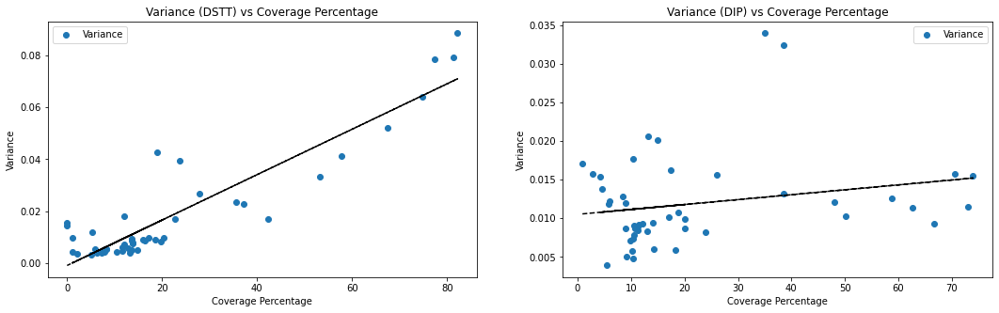

In [18]:
#Plot coverage correlation for Line 1 and Line 10 separately
plot_correlation(coverage_list_1, coverage_list_3, variance_list_1, variance_list_3)
plot_correlation(coverage_list_2, coverage_list_4, variance_list_2, variance_list_4)

#Plot coverage correlation for DSTT vs DIP (overall)
plot_correlation(DSTT_list_coverage, DIP_list_coverage, DSTT_list, DIP_list)

# Ground-truth assessment

Section 3.2.3.1

Average R2 (DSTT): 0.872
Average MAE (DSTT): 122.316
Average MAPE (DSTT): 135617585295546.875
Average Variance (DSTT): 29.285
Average R2 (DSTT): 0.761
Average MAE (DSTT): 131.356
Average MAPE (DSTT): 258861103873473.562
Average Variance (DSTT): 33.094
Average R2 (DIP): 0.866
Average MAE (DIP): 106.002
Average MAPE (DIP): 67096619563175.320
Average Variance (DIP): 42.886
Average R2 (DIP): 0.795
Average MAE (DIP): 70.037
Average MAPE (DIP): 150401044020064.906
Average Variance (DIP): 35.142


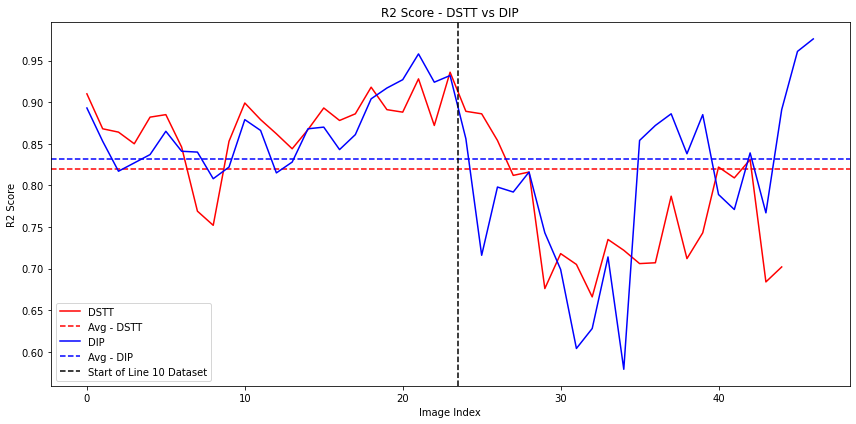

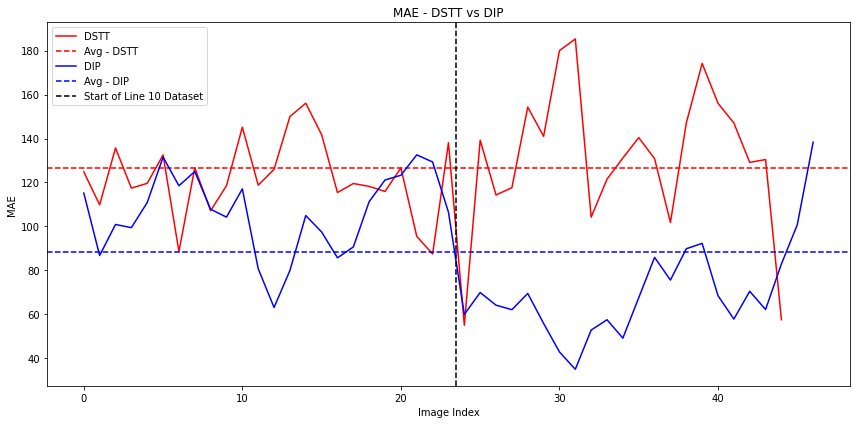

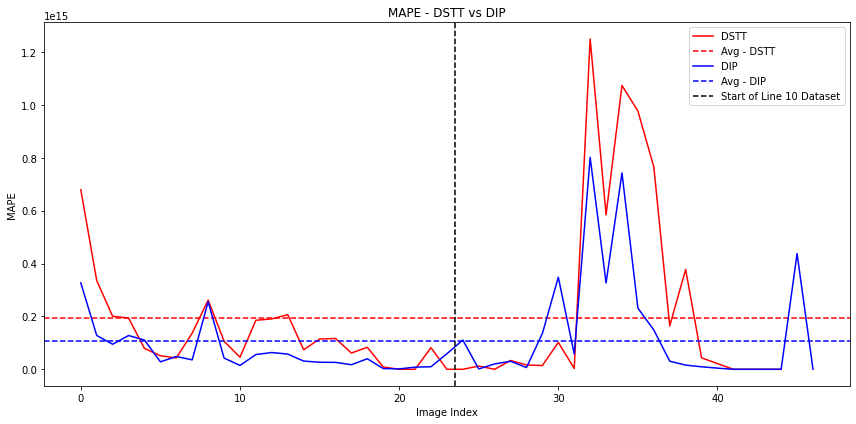

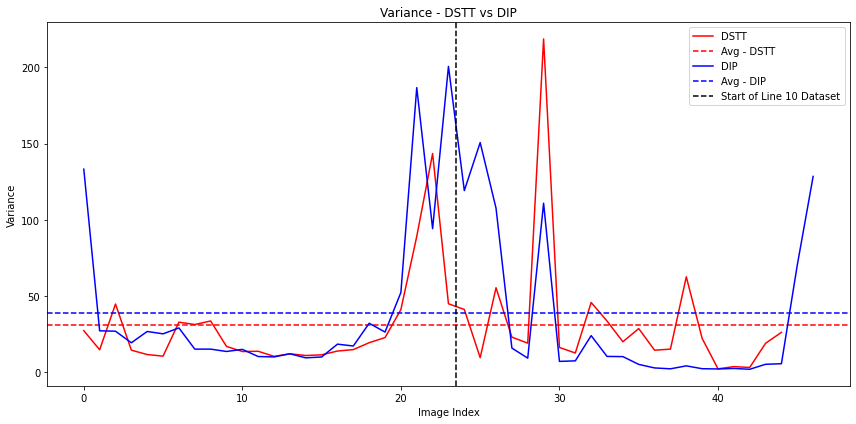

Correlation Coefficient (R2 Score (DSTT) vs Coverage Percentage): -0.591968445306517
Correlation Coefficient (R2 Score (DIP) vs Coverage Percentage): -0.31889900862628506
Correlation Coefficient (MAE (DSTT) vs Coverage Percentage): 0.29830824466666456
Correlation Coefficient (MAE (DSTT) vs Coverage Percentage): -0.4210729700451678


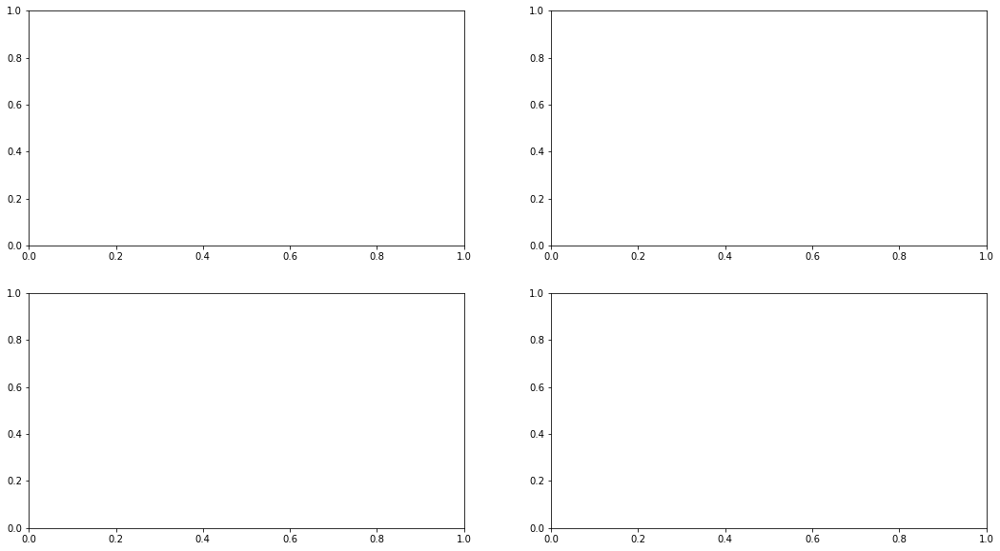

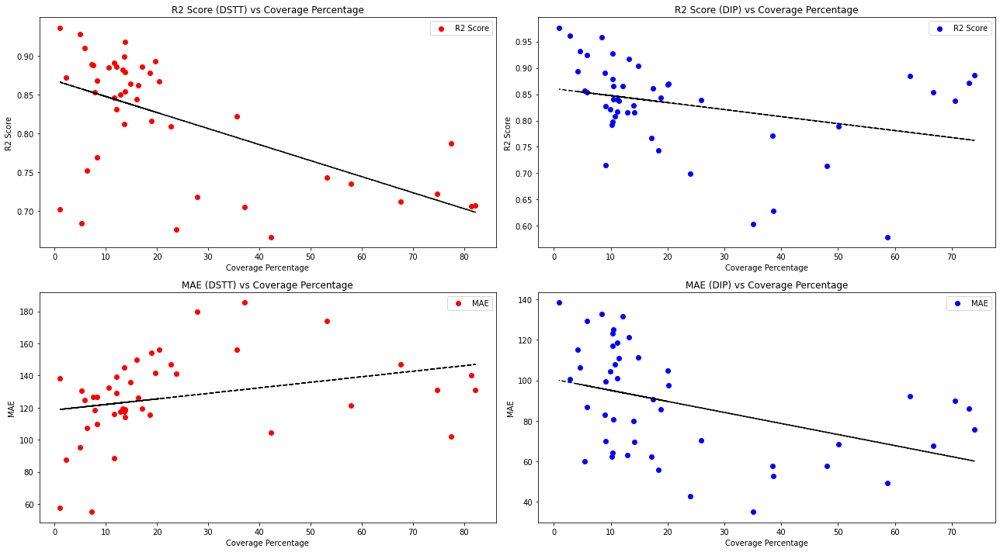

Average Coverage Percentage: 23.19892403978052
Minimum Coverage Percentage: 1.057098765432099
Maximum Coverage Percentage: 82.19618055555556
Average Coverage Percentage: 22.149317437335025
Minimum Coverage Percentage: 0.9067162535244361
Maximum Coverage Percentage: 73.94120065789474
Correlation Coefficient (Variance vs Coverage Percentage) DSTT: -0.07426758848203646
Correlation Coefficient (Variance vs Coverage Percentage) DIP: -0.4480846728633883


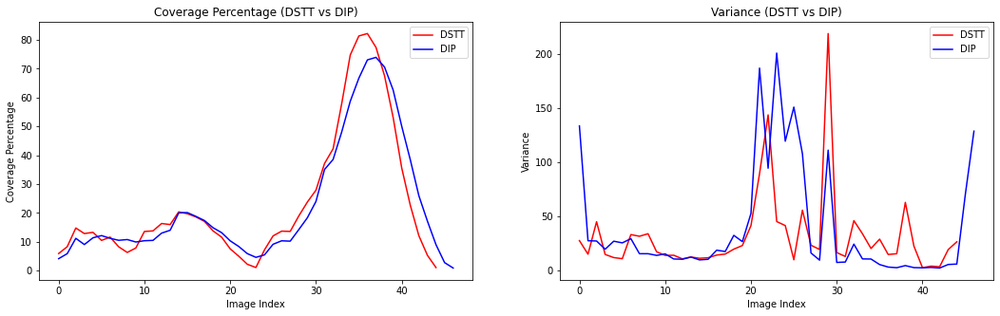

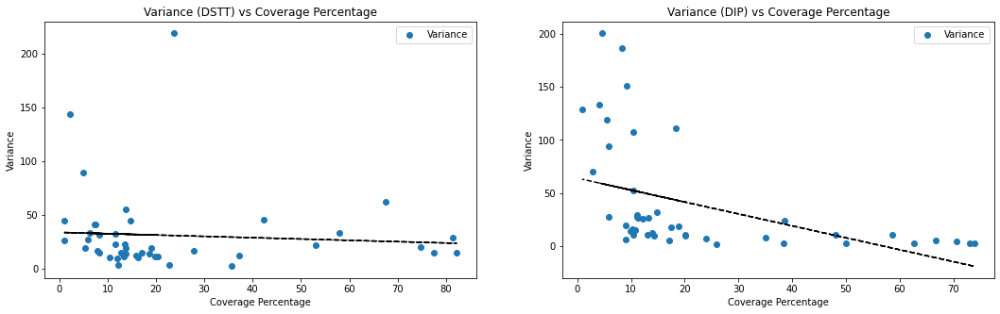

Average R2: 0.820
Average MAE: 126.535
Average MSE: 193131227298579.344
Average VAR: 31.062
Average R2: 0.831
Average MAE: 88.402
Average MSE: 107862614510163.812
Average VAR: 39.096


In [21]:
def filter_none_values(coverage_list, metric_list):
    filtered_coverage = []
    filtered_metric = []
    for coverage, metric in zip(coverage_list, metric_list):
        if metric is not None and coverage is not None:
            filtered_coverage.append(coverage)
            filtered_metric.append(metric)
    return filtered_coverage, filtered_metric

def plot_correlation(coverage_list_1, coverage_list_2, variance_list_1, variance_list_2):
    
    # Filter out None values for DSTT VAR
    coverage_list_1, variance_list_1 = filter_none_values(coverage_list_1, variance_list_1)
    # Filter out None values for DIP VAR
    coverage_list_2, variance_list_2 = filter_none_values(coverage_list_2, variance_list_2)
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    ax[0].plot(coverage_list_1, c='r',label='DSTT')
    ax[0].plot(coverage_list_2, c='b',label='DIP')
    ax[0].legend()
    ax[0].set_ylabel("Coverage Percentage")
    ax[0].set_xlabel("Image Index")
    ax[0].set_title("Coverage Percentage (DSTT vs DIP)")
    
    ax[1].plot([var for var in variance_list_1], c='r',label='DSTT')
    ax[1].plot([var for var in variance_list_2], c='b',label='DIP')
    ax[1].legend()
    ax[1].set_ylabel("Variance")
    ax[1].set_xlabel("Image Index")
    ax[1].set_title("Variance (DSTT vs DIP)")
    
    #Average_var(variance_list_1)
    #Average_var(variance_list_2)
    Average_coverage(coverage_list_1)
    Average_coverage(coverage_list_2)
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    # Scatterplot with best fit line for DSTT
    ax[0].scatter(coverage_list_1, [var for var in variance_list_1], label='Variance')
    ax[0].set_xlabel("Coverage Percentage")
    ax[0].set_ylabel("Variance")
    ax[0].set_title("Variance (DSTT) vs Coverage Percentage")
    ax[0].legend()

    # Perform linear regression for DSTT
    m1, b1 = np.polyfit(coverage_list_1, [var for var in variance_list_1], 1)
    ax[0].plot(coverage_list_1, m1 * np.array(coverage_list_1) + b1, color='black', linestyle='--', label='Best Fit Line (DSTT)')

    correlation_coefficient_line1 = compute_correlation_coefficient([var.mean() for var in variance_list_1], coverage_list_1)
    print(f"Correlation Coefficient (Variance vs Coverage Percentage) DSTT: {correlation_coefficient_line1}")

    # Scatterplot with best fit line for DIP
    ax[1].scatter(coverage_list_2, [var for var in variance_list_2], label='Variance')
    ax[1].set_xlabel("Coverage Percentage")
    ax[1].set_ylabel("Variance")
    ax[1].set_title("Variance (DIP) vs Coverage Percentage")
    ax[1].legend()

    # Perform linear regression for DIP
    m2, b2 = np.polyfit(coverage_list_2, [var for var in variance_list_2], 1)
    ax[1].plot(coverage_list_2, m2 * np.array(coverage_list_2) + b2, color='black', linestyle='--', label='Best Fit Line (DIP)')

    correlation_coefficient_line10 = compute_correlation_coefficient([var for var in variance_list_2], coverage_list_2)
    print(f"Correlation Coefficient (Variance vs Coverage Percentage) DIP: {correlation_coefficient_line10}")

    plt.show()
def plot_metrics_for_datasets(original_image_files_1, inpainted_image_files_1, anno_files_1_1, anno_files_2_1,
                               original_image_files_2, inpainted_image_files_2, anno_files_1_2, anno_files_2_2,
                               original_image_files_3, inpainted_image_files_3, anno_files_1_3, anno_files_2_3,
                               original_image_files_4, inpainted_image_files_4, anno_files_1_4, anno_files_2_4):
    
    def process_dataset(original_image_files, inpainted_image_files, anno_files_1, anno_files_2, label):
        r2_list = []
        mae_list = []
        mape_list = []
        var_list = []
    

        for org, inp, an1, an2 in zip(original_image_files, inpainted_image_files, anno_files_1, anno_files_2):
            org_img = cv2.imread(join('.', org))
            inp_img = cv2.imread(join('.', inp))
            an1_img = cv2.imread(join('.', an1))
            an2_img = cv2.imread(join('.', an2))

            mask = np.zeros((org_img.shape[0], org_img.shape[1]))
            mask[np.where(an2_img[:, :, 2] >= 1)] = 2
            mask[np.where(an1_img[:, :, 2] >= 1)] = 1
            mask_3d = np.stack([mask, mask, mask], axis=2)

            inp_slice = inp_img[np.where(mask_3d == 2)]
            org_slice = org_img[np.where(mask_3d == 2)]

            if org_slice.any():
                var_stack = np.stack([org_slice, inp_slice])
                sigma_square = np.var(var_stack, axis=0)
                mae = mean_absolute_error(org_slice, inp_slice)
                mape = mean_absolute_percentage_error(org_slice, inp_slice)
                r2 = r2_score(org_slice, inp_slice)

                r2_list.append(round(r2, 3))
                mae_list.append(round(mae, 3))
                mape_list.append (round(mape,3))
                var_list.append(np.mean(sigma_square))
                
            else:
                r2_list.append(None)
                mae_list.append(None)
                mape_list.append(None)
                var_list.append(None)

        avg_r2 = np.mean([score for score in r2_list if score is not None])
        avg_mae = np.mean([score for score in mae_list if score is not None])
        avg_mape = np.mean([score for score in mape_list if score is not None])
        avg_var = np.mean([score for score in var_list if score is not None])

        print(f"Average R2 ({label}): {avg_r2:.3f}")
        print(f"Average MAE ({label}): {avg_mae:.3f}")
        print(f"Average MAPE ({label}): {avg_mape:.3f}")
        print(f"Average Variance ({label}): {avg_var:.3f}")

        return r2_list, mae_list, mape_list, var_list

    # Process datasets
    r2_list_1, mae_list_1, mape_list_1, var_list_1 = process_dataset(original_image_files_1, inpainted_image_files_1,
                                                        anno_files_1_1, anno_files_2_1, 'DSTT')

    r2_list_2, mae_list_2, mape_list_2, var_list_2 = process_dataset(original_image_files_2, inpainted_image_files_2,
                                                        anno_files_1_2, anno_files_2_2, 'DSTT')
    
    r2_list_3, mae_list_3, mape_list_3, var_list_3 = process_dataset(original_image_files_3, inpainted_image_files_3,
                                                        anno_files_1_3, anno_files_2_3, 'DIP')

    r2_list_4, mae_list_4, mape_list_4, var_list_4 = process_dataset(original_image_files_4, inpainted_image_files_4,
                                                        anno_files_1_4, anno_files_2_4, 'DIP')
    
    r2_list_DSTT = r2_list_1 + r2_list_2
    r2_list_DIP = r2_list_3 + r2_list_4
    
    mae_list_DSTT = mae_list_1 + mae_list_2
    mae_list_DIP = mae_list_3 + mae_list_4
    
    mape_list_DSTT = mape_list_1 + mape_list_2
    mape_list_DIP = mape_list_3 + mape_list_4
    
    var_list_DSTT = var_list_1 + var_list_2
    var_list_DIP = var_list_3 + var_list_4

    # Plot metrics for Dataset 1
    #plot_metrics(r2_list_1, mae_list_1, var_list_1)

    # Plot metrics for Dataset 2
    #plot_metrics(r2_list_2, mae_list_2, var_list_2)

    # Plot combined metrics
    plot_combined_metrics(r2_list_DSTT, r2_list_DIP,r2_list_1, 'R2 Score')
    plot_combined_metrics(mae_list_DSTT, mae_list_DIP,mae_list_1, 'MAE')
    plot_combined_metrics(mape_list_DSTT, mape_list_DIP, mape_list_1,'MAPE')
    plot_combined_metrics(var_list_DSTT, var_list_DIP,var_list_1, 'Variance')
    plot_correlation_r2mae(DSTT_list_coverage, DIP_list_coverage, r2_list_DSTT, r2_list_DIP, mae_list_DSTT, mae_list_DIP)
    plot_correlation(DSTT_list_coverage, DIP_list_coverage, var_list_DSTT, var_list_DIP)
    
    
    avg_r2_DSTT = np.mean([score for score in r2_list_DSTT if score is not None])
    avg_mae_DSTT = np.mean([score for score in mae_list_DSTT if score is not None])
    avg_mape_DSTT = np.mean([score for score in mape_list_DSTT if score is not None])
    avg_var_DSTT = np.mean([score for score in var_list_DSTT if score is not None])
    
    avg_r2_DIP = np.mean([score for score in r2_list_DIP if score is not None])
    avg_mae_DIP = np.mean([score for score in mae_list_DIP if score is not None])
    avg_mape_DIP = np.mean([score for score in mape_list_DIP if score is not None])
    avg_var_DIP = np.mean([score for score in var_list_DIP if score is not None])

    print(f"Average R2: {avg_r2_DSTT:.3f}")
    print(f"Average MAE: {avg_mae_DSTT:.3f}")
    print(f"Average MSE: {avg_mape_DSTT:.3f}")
    print(f"Average VAR: {avg_var_DSTT:.3f}")

    print(f"Average R2: {avg_r2_DIP:.3f}")
    print(f"Average MAE: {avg_mae_DIP:.3f}")
    print(f"Average MSE: {avg_mape_DIP:.3f}")
    print(f"Average VAR: {avg_var_DIP:.3f}")


def plot_metrics(metric_list_1, metric_list_2, metric_name):
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 2, 1)
    plt.plot(metric_list_1, label='DSTT', color='red')
    plt.axhline(y=np.mean([score for score in metric_list_1 if score is not None]), color='r', linestyle='--', label='Avg - DSTT')
    plt.xlabel('Image Index')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} - DSTT')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(metric_list_2, label='DIP', color='blue')
    plt.axhline(y=np.mean([score for score in metric_list_2 if score is not None]), color='b', linestyle='--', label='Avg - DIP')
    plt.xlabel('Image Index')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} - DIP')
    plt.legend()

    plt.tight_layout()
    plt.show()


def plot_combined_metrics(metric_list_1, metric_list_2, metric_list_1_1, metric_name):
    plt.figure(figsize=(12, 6))
    
    combined_length = len(metric_list_1_1)

    plt.plot(metric_list_1, label='DSTT', color='red')
    plt.axhline(y=np.mean([score for score in metric_list_1 if score is not None]), color='r', linestyle='--', label='Avg - DSTT')
    
    plt.plot(metric_list_2, label='DIP', color='blue')
    plt.axhline(y=np.mean([score for score in metric_list_2 if score is not None]), color='b', linestyle='--', label='Avg - DIP')
   
    plt.axvline(x=combined_length - 0.5, color='k', linestyle='--', label='Start of Line 10 Dataset')
    
    plt.xlabel('Image Index')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} - DSTT vs DIP')
    plt.legend()

    plt.tight_layout()
    plt.show()
    


def plot_correlation_r2mae(coverage_list_DSTT, coverage_list_DIP, r2_list_DSTT, r2_list_DIP, mae_list_DSTT, mae_list_DIP):
    fig, axs = plt.subplots(2, 2, figsize=(18, 10))

    # Filter out None values for DSTT R2
    filtered_coverage_DSTT_r2, filtered_r2_DSTT = filter_none_values(coverage_list_DSTT, r2_list_DSTT)
    # Filter out None values for DIP R2
    filtered_coverage_DIP_r2, filtered_r2_DIP = filter_none_values(coverage_list_DIP, r2_list_DIP)
    # Filter out None values for DSTT MAE
    filtered_coverage_DSTT_mae, filtered_mae_DSTT = filter_none_values(coverage_list_DSTT, mae_list_DSTT)
    # Filter out None values for DIP MAE
    filtered_coverage_DIP_mae, filtered_mae_DIP = filter_none_values(coverage_list_DIP, mae_list_DIP)
    
    fig, axs = plt.subplots(2, 2, figsize=(18, 10))  # Adjust for 4 subplots
    
    
    # R2 Score Correlation for DSTT
    axs[0, 0].scatter(filtered_coverage_DSTT_r2,  filtered_r2_DSTT, label='R2 Score', color='r')
    axs[0, 0].set_xlabel("Coverage Percentage")
    axs[0, 0].set_ylabel("R2 Score")
    axs[0, 0].set_title("R2 Score (DSTT) vs Coverage Percentage")
    axs[0, 0].legend()
    # Linear regression for DSTT R2
    m1, b1 = np.polyfit(filtered_coverage_DSTT_r2,filtered_r2_DSTT, 1)
    axs[0, 0].plot(filtered_coverage_DSTT_r2, m1 * np.array(filtered_coverage_DSTT_r2) + b1, color='black', linestyle='--')
    correlation_coefficient_R2_DSTT = compute_correlation_coefficient(filtered_r2_DSTT,filtered_coverage_DSTT_r2)
    print(f"Correlation Coefficient (R2 Score (DSTT) vs Coverage Percentage): {correlation_coefficient_R2_DSTT}")
    
    
    # R2 Score Correlation for DIP
    axs[0, 1].scatter(filtered_coverage_DIP_r2, filtered_r2_DIP, label='R2 Score', color='b')
    axs[0, 1].set_xlabel("Coverage Percentage")
    axs[0, 1].set_ylabel("R2 Score")
    axs[0, 1].set_title("R2 Score (DIP) vs Coverage Percentage")
    axs[0, 1].legend()
    # Linear regression for DIP R2
    m2, b2 = np.polyfit(filtered_coverage_DIP_r2, filtered_r2_DIP, 1)
    axs[0, 1].plot(filtered_coverage_DIP_r2, m2 * np.array(filtered_coverage_DIP_r2) + b2, color='black', linestyle='--', label='Best Fit Line (DIP)')
    correlation_coefficient_R2_DIP = compute_correlation_coefficient(filtered_r2_DIP,filtered_coverage_DIP_r2)
    print(f"Correlation Coefficient (R2 Score (DIP) vs Coverage Percentage): {correlation_coefficient_R2_DIP}")
    
    
    # MAE Correlation for DSTT
    axs[1, 0].scatter(filtered_coverage_DSTT_mae, filtered_mae_DSTT, label='MAE', color='r')
    axs[1, 0].set_xlabel("Coverage Percentage")
    axs[1, 0].set_ylabel("MAE")
    axs[1, 0].set_title("MAE (DSTT) vs Coverage Percentage")
    axs[1, 0].legend()
    # Linear regression for DSTT MAE
    m3, b3 = np.polyfit(filtered_coverage_DSTT_mae, filtered_mae_DSTT, 1)
    axs[1, 0].plot(filtered_coverage_DSTT_mae, m3 * np.array(filtered_coverage_DSTT_mae) + b3, color='black', linestyle='--', label='Best Fit Line (DSTT)')
    correlation_coefficient_mae_DSTT = compute_correlation_coefficient(filtered_mae_DSTT,filtered_coverage_DSTT_mae)
    print(f"Correlation Coefficient (MAE (DSTT) vs Coverage Percentage): {correlation_coefficient_mae_DSTT}")
    
    # MAE Correlation for DIP
    axs[1, 1].scatter(filtered_coverage_DIP_mae, filtered_mae_DIP, label='MAE', color='b')
    axs[1, 1].set_xlabel("Coverage Percentage")
    axs[1, 1].set_ylabel("MAE")
    axs[1, 1].set_title("MAE (DIP) vs Coverage Percentage")
    axs[1, 1].legend()
    # Linear regression for DIP MAE
    m4, b4 = np.polyfit(filtered_coverage_DIP_mae, filtered_mae_DIP, 1)
    axs[1, 1].plot(filtered_coverage_DIP_mae, m4 * np.array(filtered_coverage_DIP_mae) + b4, color='black', linestyle='--', label='Best Fit Line (DSTT)')
    correlation_coefficient_mae_DIP = compute_correlation_coefficient(filtered_mae_DIP,filtered_coverage_DIP_mae)
    print(f"Correlation Coefficient (MAE (DSTT) vs Coverage Percentage): {correlation_coefficient_mae_DIP}")
   
    
    
    plt.tight_layout()
    plt.show()


# LINE 1 DSTT
original_image_files_1 = sorted(['ORG_DSTT_Normalised_line1/{}'.format(f) for f in os.listdir('ORG_DSTT_Normalised_line1')])
inpainted_image_files_1 = sorted(['INPAINTED_DSTT_Normalised_Line1/{}'.format(f) for f in os.listdir('INPAINTED_DSTT_Normalised_Line1')])
anno_files_1_1 = sorted(['ANNOTATIONS_DSTT_precise_Line1/{}'.format(f) for f in os.listdir('ANNOTATIONS_DSTT_precise_Line1')])
anno_files_2_1 = sorted(['ANNOTATIONS_DSTT_shadow_Line1/{}'.format(f) for f in os.listdir('ANNOTATIONS_DSTT_shadow_Line1')])
 
#LINE 10 DSTT
original_image_files_2 = sorted(['ORG_DSTT_Normalised_Line10/{}'.format(f) for f in os.listdir('ORG_DSTT_Normalised_Line10')])
inpainted_image_files_2 = sorted(['INPAINTED_DSTT_Normalised_Line10/{}'.format(f) for f in os.listdir('INPAINTED_DSTT_Normalised_Line10')])
anno_files_1_2 = sorted(['ANNOTATIONS_DSTT_precise_Line10/{}'.format(f) for f in os.listdir('ANNOTATIONS_DSTT_precise_Line10')])
anno_files_2_2 = sorted(['ANNOTATIONS_DSTT_shadow_Line10/{}'.format(f) for f in os.listdir('ANNOTATIONS_DSTT_shadow_Line10')])

#LINE 1 DIP
original_image_files_3 = sorted(['ORG_DIP_Normalised_line1/{}'.format(f) for f in os.listdir('ORG_DIP_Normalised_line1')])
inpainted_image_files_3 = sorted(['INPAINTED_DIP_Normalised_line1/{}'.format(f) for f in os.listdir('INPAINTED_DIP_Normalised_line1')])
anno_files_1_3 = sorted(['ANNOTATIONS_DIP_precise_Line1/{}'.format(f) for f in os.listdir('ANNOTATIONS_DIP_precise_Line1')])
anno_files_2_3 = sorted(['ANNOTATIONS_DIP_shadow_Line1/{}'.format(f) for f in os.listdir('ANNOTATIONS_DIP_shadow_Line1')])


#LINE 10 DIP
original_image_files_4 = sorted(['ORG_DIP_Normalised_Line10/{}'.format(f) for f in os.listdir('ORG_DIP_Normalised_Line10')])
inpainted_image_files_4 = sorted(['INPAINTED_DIP_Normalised_Line10/{}'.format(f) for f in os.listdir('INPAINTED_DIP_Normalised_Line10')])
anno_files_1_4 = sorted(['ANNOTATIONS_DIP_precise_Line10/{}'.format(f) for f in os.listdir('ANNOTATIONS_DIP_precise_Line10')])
anno_files_2_4 = sorted(['ANNOTATIONS_DIP_shadow_Line10/{}'.format(f) for f in os.listdir('ANNOTATIONS_DIP_shadow_Line10')])

plot_metrics_for_datasets(original_image_files_1, inpainted_image_files_1, anno_files_1_1, anno_files_2_1,
                           original_image_files_2, inpainted_image_files_2, anno_files_1_2, anno_files_2_2,
                           original_image_files_3, inpainted_image_files_3, anno_files_1_3, anno_files_2_3,
                           original_image_files_4, inpainted_image_files_4, anno_files_1_4, anno_files_2_4)




Plotting and Testing for images Fig3.8.

In [15]:
#Read two processed images and two annotation images
origi = cv2.imread(join('.','ORG_DIP_Normalised_Line10','00000.png'))
inpai = cv2.imread(join('.','INPAINTED_DIP_Normalised_Line10','00000.png'))
anno1 = cv2.imread(join('.','ANNOTATIONS_DIP_precise_Line10','00000.png'))
anno2 = cv2.imread(join('.','ANNOTATIONS_DIP_shadow_Line10','00000.png'))
print('Shape: {} - Min: {} - Max: {}'.format(origi.shape,np.min(origi),np.max(origi)))
print('Shape: {} - Min: {} - Max: {}'.format(inpai.shape,np.min(inpai),np.max(inpai)))

Shape: (896, 1216, 3) - Min: 0 - Max: 255
Shape: (896, 1216, 3) - Min: 0 - Max: 255


Inpainting performed for this image with R2: 0.8562369303598565 and MAE: 0.09381117308483412


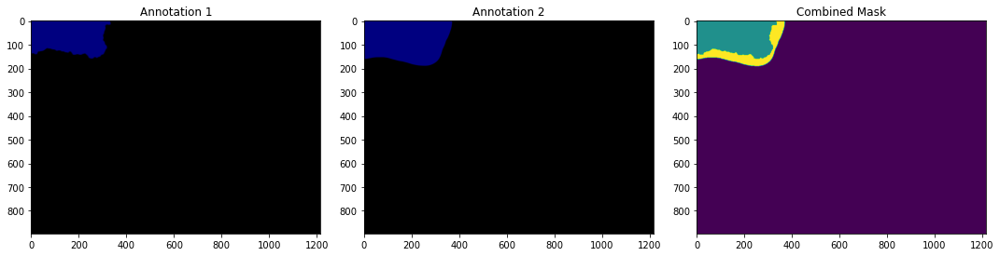

In [16]:
combined_mask = np.zeros((anno1.shape[0],anno1.shape[1]))
combined_mask[np.where(anno2[:,:,2]>=1)] = 2
combined_mask[np.where(anno1[:,:,2]>=1)] = 1
combined_mask[70:80,320:330]

final_mask = np.stack([combined_mask,combined_mask,combined_mask],axis=2)
final_mask.shape

inpainted_slice = inpai[np.where(final_mask==2)]
original_slice = origi[np.where(final_mask==2)]
original_slice.shape

#MAE = mean_absolute_error(original_slice,inpainted_slice)
R2 = r2_score(original_slice,inpainted_slice)

original_slice_norm = original_slice / np.max(original_slice)
inpainted_slice_norm = inpainted_slice / np.max(inpainted_slice)

MAE = mean_absolute_error(original_slice_norm, inpainted_slice_norm)

print('Inpainting performed for this image with R2: {} and MAE: {}'.format(R2, MAE))


# Create a figure and axis objects with a larger figsize
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image
ax[0].imshow(anno1)
ax[0].set_title('Annotation 1')

# Plot the second image
ax[1].imshow(anno2)
ax[1].set_title('Annotation 2')

# Plot the third image
ax[2].imshow(combined_mask)
ax[2].set_title('Combined Mask')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()